<h1 style="font-size: 38px; text-align: center; color: blue">The implementation of deep learning to develop an adequate tool for identifying the bumblebee species in Ireland</h1>

<br> </br>

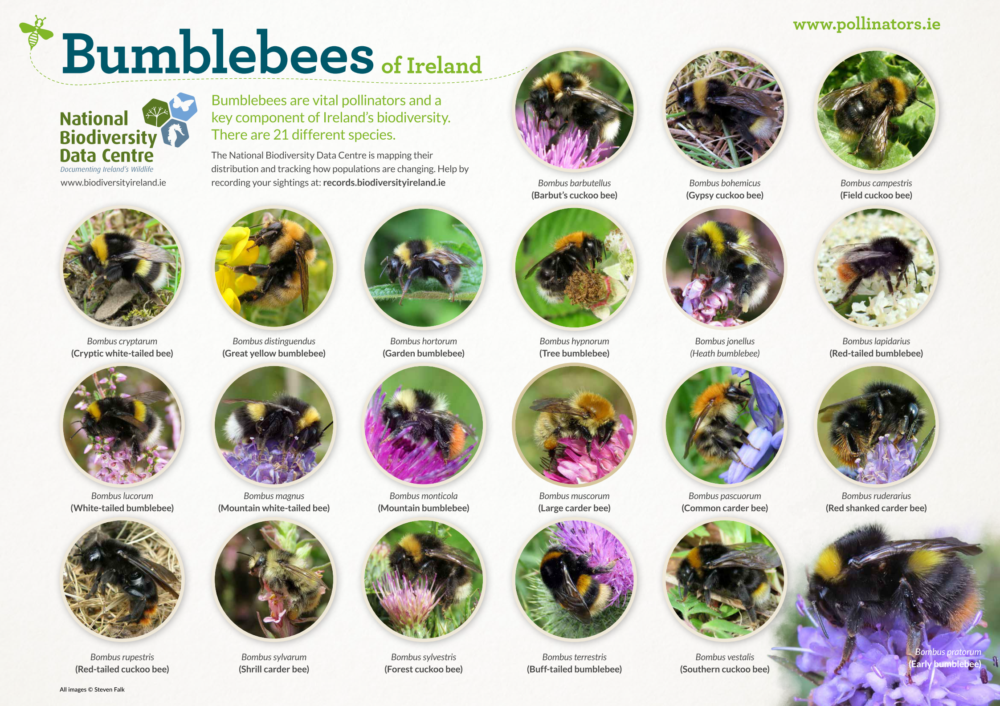

<br> </br>

<h1 style="font-size: 28px; text-align: center; color: green"> 1. Data Preparation </h1>

<br> </br>

In [1]:
# Import libraries
import os
import shutil
import random
import xml.etree.ElementTree as ET
import cv2

import warnings
warnings.filterwarnings("ignore")

In [2]:
## Split the data into two parts, one for training and validating, one for testing

# # Set the path to the root of the data
# image_dir = '/home/hduser/Desktop/final dataset testing'

# # Set the percentage for the training and validating
# # the rest is for testing
# train_percentage = 0.9

# # Create directories for training and testing sets
# train_dir = os.path.join(image_dir, 'train')
# test_dir = os.path.join(image_dir, 'test')
# os.makedirs(train_dir, exist_ok=True)
# os.makedirs(test_dir, exist_ok=True)

# # Create the bumblebee species list
species_list = [
    'barbutellus', 'bohemicus', 'campestris', 'cryptarum', 'distinguendus',
    'hortorum', 'hypnorum', 'jonellus', 'lapidarius', 'lucorum',
    'magnus', 'monticola', 'muscorum', 'pascuorum', 'pratorum',
    'ruderarius', 'rupestris', 'sylvarum', 'sylvestris', 'terrestris', 'vestalis'
]

# # Set random seed so that the research is replicable
# random.seed(42)

# # Iterate through each species and copy related images to the train and test folders
# for species in species_list:
#     # Get all images for the 21 bumblebee species
#     species_images = [file for file in os.listdir(image_dir) if species in file]
    
#     # Calculate the number of images for training
#     num_train = int(len(species_images) * train_percentage)
    
#     # Randomly shuffle the list of images
#     random.shuffle(species_images)
    
#     # Split the images into training and testing sets
#     train_images = species_images[:num_train]
#     test_images = species_images[num_train:]
    
#     # Copy images to the corresponding directories
#     for image in train_images:
#         src_path = os.path.join(image_dir, image)
#         dest_path = os.path.join(train_dir, image)
#         shutil.copy(src_path, dest_path)
        
#     for image in test_images:
#         src_path = os.path.join(image_dir, image)
#         dest_path = os.path.join(test_dir, image)
#         shutil.copy(src_path, dest_path)

<br> </br>
<div style="text-align: justify;">
<h1 style="font-size: 18px"> All the images in the <i>train folder</i> were then uploaded onto CVAT (an open-source annotation tool) for annotating. A corresponding annotation file (.xml) was generated after. </h1>
</div>
<br> </br>

In [3]:
# # Transfer the original training images into annotated version (region of interest (ROI))

# # Read the annotation file
# os.chdir('/home/hduser/Desktop/final dataset testing/train')
# xml_file = 'bombus annotations.xml'
# tree = ET.parse(xml_file)
# root = tree.getroot()

# # Create a list to store the annotation details
# annotations = []

# # Extract mandatory info from the annotion and store in the list above
# # Iterate through each 'image' element in the XML
# for image in root.findall('image'):
#     image_id = int(image.get('id'))
#     image_name = image.get('name')
    
#     # For each 'box' element, extract bounding box coordinates
#     for box in image.findall('box'):
#         label = box.get('label')
#         xtl = float(box.get('xtl'))
#         ytl = float(box.get('ytl'))
#         xbr = float(box.get('xbr'))
#         ybr = float(box.get('ybr'))
        
#         annotations.append({
#             'image_id': image_id,
#             'image_name': image_name,
#             'label': label,
#             'xtl': xtl,
#             'ytl': ytl,
#             'xbr': xbr,
#             'ybr': ybr
#         })

# print(annotations) # Check the information

In [4]:
# # Extract ROI and convert all the images in train folder
# for annotation in annotations:
#     image = annotation['image_name']
#     xtl = int(annotation['xtl'])
#     ytl = int(annotation['ytl'])
#     xbr = int(annotation['xbr'])
#     ybr = int(annotation['ybr'])

#     image = cv2.imread(image)
#     roi_bombus = image[ytl:ybr, xtl:xbr]    
#     bombus = f"{annotation['image_name']}"
#     cv2.imwrite(bombus, roi_bombus)

In [5]:
## Split the processed train images into two parts, one for training, one for validating

# # Path to the directory containing processed train images
# input_directory = '/home/hduser/Desktop/final dataset testing/train'

# # Path to the directory for deep learning later
# output_directory = '/home/hduser/Desktop/final dataset testing/machine learning'

# # Create folders for train and validate sets
# train_directory = os.path.join(output_directory, 'train')
# validate_directory = os.path.join(output_directory, 'validate')
# os.makedirs(train_directory, exist_ok=True)
# os.makedirs(validate_directory, exist_ok=True)

# # Define the percentage for training set, hence 20% for validating
# training_percentage = 0.8

# # Set random seed so that the research is replicable
# random.seed(42)

# # Create folders for each species in train and validate sets
# for species in species_list:
#     species_train_folder = os.path.join(train_directory, f'bombus {species}')
#     species_validate_folder = os.path.join(validate_directory, f'bombus {species}')
#     os.makedirs(species_train_folder, exist_ok=True)
#     os.makedirs(species_validate_folder, exist_ok=True)

#     # List all the images for the species
#     species_images = [filename for filename in os.listdir(input_directory) if f'bombus {species}' in filename]

#     # Shuffle the images randomly
#     random.shuffle(species_images)

#     # Calculate the split point based on previously defined training percentage
#     split_point = int(len(species_images) * training_percentage)

#     # Move images to their respective folders
#     for i, filename in enumerate(species_images):
#         source_path = os.path.join(input_directory, filename)

#         if i < split_point:
#             destination_path = os.path.join(species_train_folder, filename)
#         else:
#             destination_path = os.path.join(species_validate_folder, filename)

#         shutil.move(source_path, destination_path)

In [6]:
# # Organising the test folder

# # Path to the directory containing test images
# test_directory = '/home/hduser/Desktop/final dataset testing/test'

# # Create species folders
# for species in species_list:
#     species_folder = os.path.join(test_directory, f'bombus {species}')
#     os.makedirs(species_folder, exist_ok=True)

# # Move testing images to corresponding species folders
# for filename in os.listdir(test_directory):
#     for species in species_list:
#         if species in filename.lower():
#             source_path = os.path.join(test_directory, filename)
#             destination_folder = os.path.join(test_directory, f'bombus {species}')
#             destination_path = os.path.join(destination_folder, filename)  # Include the filename here

#             # Check if the current item is a file before attempting to move it
#             if os.path.isfile(source_path):
#                 # Create the destination folder if it doesn't exist
#                 os.makedirs(destination_folder, exist_ok=True)

#                 shutil.move(source_path, destination_path)
#             break

<br> </br>

<h1 style="font-size: 28px; text-align: center; color: green"> 2. Model Training </h1>

<br> </br>

In [485]:
# Import libraries
import pathlib
import itertools
import glob
import numpy as np

import time

import PIL
from PIL import Image

import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns

import tensorflow as tf
from tensorflow import keras
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras import layers, models
from tensorflow.keras.models import Sequential, Model
from tensorflow.keras.layers import Input, Resizing, Rescaling, Activation, Dense, Flatten, Dropout
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.metrics import categorical_crossentropy

from sklearn.metrics import confusion_matrix, classification_report
from sklearn.metrics import roc_curve, auc
from sklearn.preprocessing import label_binarize

In [125]:
# Set data directory for training, validating and testing
training_data_dir = pathlib.Path('/home/hduser/Desktop/final dataset testing/machine learning/train/')
validate_data_dir = pathlib.Path('/home/hduser/Desktop/final dataset testing/machine learning/validate/')
test_data_dir = pathlib.Path('/home/hduser/Desktop/final dataset testing/test')

print(training_data_dir)
print(validate_data_dir)
print(test_data_dir)

/home/hduser/Desktop/final dataset testing/machine learning/train
/home/hduser/Desktop/final dataset testing/machine learning/validate
/home/hduser/Desktop/final dataset testing/test


<br> </br>
- **Check the image in the train folder**

In [126]:
bombus_barbutellus = list(training_data_dir.glob('bombus barbutellus/*'))
len(bombus_barbutellus)

144

/home/hduser/Desktop/final dataset testing/machine learning/train/bombus barbutellus/bombus barbutellus inaturalist 13.8.jpg


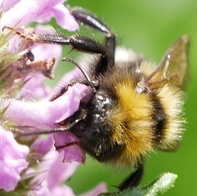

In [127]:
print(bombus_barbutellus[20])
PIL.Image.open(str(bombus_barbutellus[20]))

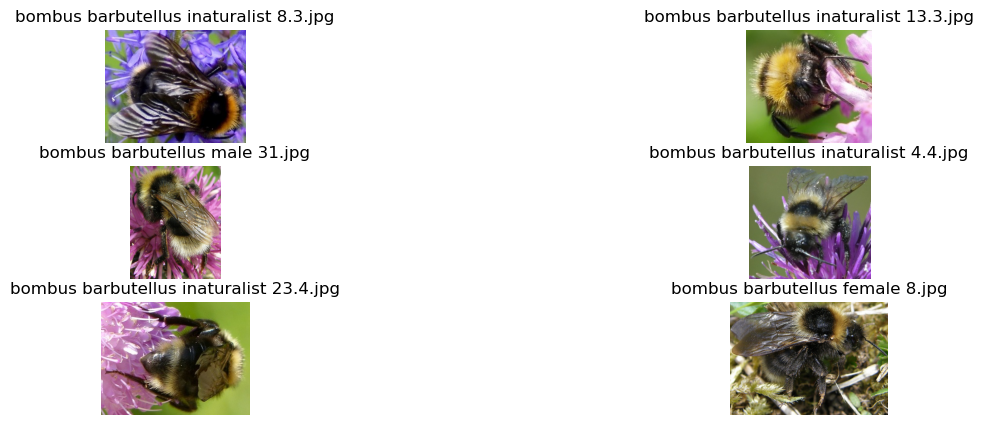

In [132]:
fig, axes = plt.subplots(3, 2, figsize=(15, 5))

# Plot each image
for i in range(6):
    image_path = bombus_barbutellus[i]
    image = Image.open(str(image_path))

    # Extract filename from path
    filename = os.path.basename(image_path)

    # Display the image on the subplot
    axes[i//2, i%2].imshow(image)
    axes[i//2, i%2].set_title(filename)
    axes[i//2, i%2].axis('off')

plt.show()

<br> </br>
## 2.1 Deep learning using tensorflow and keras
<br> </br>

### 2.1.1. InceptionV3

In [11]:
# Specify image size and batch size
img_height_incep, img_width_incep = (299, 299)
batch_size = 32

In [13]:
train_batches_incep = ImageDataGenerator(preprocessing_function=
                                         tf.keras.applications.inception_v3.preprocess_input) \
                    .flow_from_directory(training_data_dir, target_size=(img_height_incep, img_width_incep),
                                         batch_size=batch_size, class_mode='categorical', 
                                         shuffle=True)

Found 3024 images belonging to 21 classes.


In [14]:
validate_batches_incep = ImageDataGenerator(preprocessing_function=
                                            tf.keras.applications.inception_v3.preprocess_input) \
                    .flow_from_directory(validate_data_dir, target_size=(img_height_incep, img_width_incep),
                                         batch_size=batch_size, class_mode='categorical', 
                                         shuffle=True)

Found 756 images belonging to 21 classes.


In [15]:
def plotImages(images_arr):
    fig, axes = plt.subplots(2, 6, figsize=(30,30))
    axes = axes.flatten()
    for img, ax in zip( images_arr, axes):
        ax.imshow(img)
        ax.axis('off')
    plt.tight_layout()
    plt.show()

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

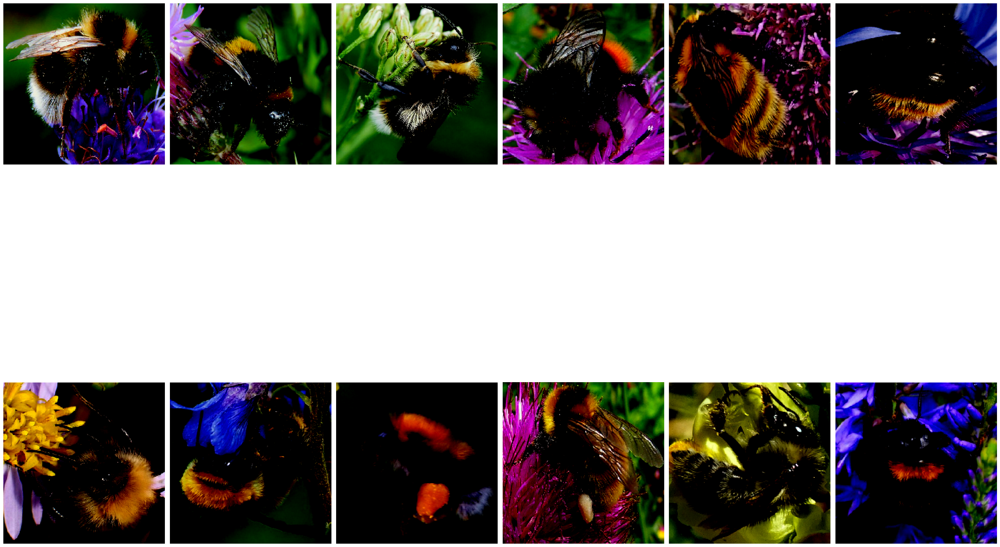

[[0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
 [0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0.]
 [1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0.

In [16]:
imgs, labels = next(train_batches_incep)

plotImages(imgs)
print(labels)

In [58]:
inceptionv3 = tf.keras.applications.InceptionV3(
    include_top=False,
    input_shape=(299, 299, 3),
    pooling='avg',
    weights='imagenet')

for layer in inceptionv3.layers:
        layer.trainable=False

In [59]:
inceptionv3.summary()

Model: "inception_v3"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_5 (InputLayer)        [(None, 299, 299, 3)]        0         []                            
                                                                                                  
 conv2d_376 (Conv2D)         (None, 149, 149, 32)         864       ['input_5[0][0]']             
                                                                                                  
 batch_normalization_376 (B  (None, 149, 149, 32)         96        ['conv2d_376[0][0]']          
 atchNormalization)                                                                               
                                                                                                  
 activation_376 (Activation  (None, 149, 149, 32)         0         ['batch_normalizati

                                                                                                  
 conv2d_387 (Conv2D)         (None, 35, 35, 32)           6144      ['average_pooling2d_36[0][0]']
                                                                                                  
 batch_normalization_381 (B  (None, 35, 35, 64)           192       ['conv2d_381[0][0]']          
 atchNormalization)                                                                               
                                                                                                  
 batch_normalization_383 (B  (None, 35, 35, 64)           192       ['conv2d_383[0][0]']          
 atchNormalization)                                                                               
                                                                                                  
 batch_normalization_386 (B  (None, 35, 35, 96)           288       ['conv2d_386[0][0]']          
 atchNorma

 )                                                                  ]']                           
                                                                                                  
 activation_393 (Activation  (None, 35, 35, 96)           0         ['batch_normalization_393[0][0
 )                                                                  ]']                           
                                                                                                  
 activation_394 (Activation  (None, 35, 35, 64)           0         ['batch_normalization_394[0][0
 )                                                                  ]']                           
                                                                                                  
 mixed1 (Concatenate)        (None, 35, 35, 288)          0         ['activation_388[0][0]',      
                                                                     'activation_390[0][0]',      
          

 )                                                                  ]']                           
                                                                                                  
 conv2d_404 (Conv2D)         (None, 35, 35, 96)           55296     ['activation_403[0][0]']      
                                                                                                  
 batch_normalization_404 (B  (None, 35, 35, 96)           288       ['conv2d_404[0][0]']          
 atchNormalization)                                                                               
                                                                                                  
 activation_404 (Activation  (None, 35, 35, 96)           0         ['batch_normalization_404[0][0
 )                                                                  ]']                           
                                                                                                  
 conv2d_40

                                                                                                  
 conv2d_406 (Conv2D)         (None, 17, 17, 192)          147456    ['mixed3[0][0]']              
                                                                                                  
 conv2d_409 (Conv2D)         (None, 17, 17, 192)          172032    ['activation_408[0][0]']      
                                                                                                  
 conv2d_414 (Conv2D)         (None, 17, 17, 192)          172032    ['activation_413[0][0]']      
                                                                                                  
 conv2d_415 (Conv2D)         (None, 17, 17, 192)          147456    ['average_pooling2d_39[0][0]']
                                                                                                  
 batch_normalization_406 (B  (None, 17, 17, 192)          576       ['conv2d_406[0][0]']          
 atchNorma

 activation_423 (Activation  (None, 17, 17, 160)          0         ['batch_normalization_423[0][0
 )                                                                  ]']                           
                                                                                                  
 average_pooling2d_40 (Aver  (None, 17, 17, 768)          0         ['mixed4[0][0]']              
 agePooling2D)                                                                                    
                                                                                                  
 conv2d_416 (Conv2D)         (None, 17, 17, 192)          147456    ['mixed4[0][0]']              
                                                                                                  
 conv2d_419 (Conv2D)         (None, 17, 17, 192)          215040    ['activation_418[0][0]']      
                                                                                                  
 conv2d_42

 atchNormalization)                                                                               
                                                                                                  
 activation_428 (Activation  (None, 17, 17, 160)          0         ['batch_normalization_428[0][0
 )                                                                  ]']                           
                                                                                                  
 activation_433 (Activation  (None, 17, 17, 160)          0         ['batch_normalization_433[0][0
 )                                                                  ]']                           
                                                                                                  
 average_pooling2d_41 (Aver  (None, 17, 17, 768)          0         ['mixed5[0][0]']              
 agePooling2D)                                                                                    
          

                                                                                                  
 batch_normalization_438 (B  (None, 17, 17, 192)          576       ['conv2d_438[0][0]']          
 atchNormalization)                                                                               
                                                                                                  
 batch_normalization_443 (B  (None, 17, 17, 192)          576       ['conv2d_443[0][0]']          
 atchNormalization)                                                                               
                                                                                                  
 activation_438 (Activation  (None, 17, 17, 192)          0         ['batch_normalization_438[0][0
 )                                                                  ]']                           
                                                                                                  
 activatio

 )                                                                  ]']                           
                                                                                                  
 conv2d_447 (Conv2D)         (None, 8, 8, 320)            552960    ['activation_446[0][0]']      
                                                                                                  
 conv2d_451 (Conv2D)         (None, 8, 8, 192)            331776    ['activation_450[0][0]']      
                                                                                                  
 batch_normalization_447 (B  (None, 8, 8, 320)            960       ['conv2d_447[0][0]']          
 atchNormalization)                                                                               
                                                                                                  
 batch_normalization_451 (B  (None, 8, 8, 192)            576       ['conv2d_451[0][0]']          
 atchNorma

 )                                                                  ]']                           
                                                                                                  
 activation_458 (Activation  (None, 8, 8, 384)            0         ['batch_normalization_458[0][0
 )                                                                  ]']                           
                                                                                                  
 activation_459 (Activation  (None, 8, 8, 384)            0         ['batch_normalization_459[0][0
 )                                                                  ]']                           
                                                                                                  
 batch_normalization_460 (B  (None, 8, 8, 192)            576       ['conv2d_460[0][0]']          
 atchNormalization)                                                                               
          

 )                                                                  ]']                           
                                                                                                  
 activation_464 (Activation  (None, 8, 8, 384)            0         ['batch_normalization_464[0][0
 )                                                                  ]']                           
                                                                                                  
 activation_467 (Activation  (None, 8, 8, 384)            0         ['batch_normalization_467[0][0
 )                                                                  ]']                           
                                                                                                  
 activation_468 (Activation  (None, 8, 8, 384)            0         ['batch_normalization_468[0][0
 )                                                                  ]']                           
          

In [60]:
model_inceptionv3 = Sequential()

model_inceptionv3.add(inceptionv3)
model_inceptionv3.add(Flatten())
model_inceptionv3.add(Dense(512, activation='relu'))
model_inceptionv3.add(Dropout(0.2))
model_inceptionv3.add(Dense(21, activation='softmax'))

In [61]:
model_inceptionv3.summary()

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 inception_v3 (Functional)   (None, 2048)              21802784  
                                                                 
 flatten_2 (Flatten)         (None, 2048)              0         
                                                                 
 dense_4 (Dense)             (None, 512)               1049088   
                                                                 
 dropout_2 (Dropout)         (None, 512)               0         
                                                                 
 dense_5 (Dense)             (None, 21)                10773     
                                                                 
Total params: 22862645 (87.21 MB)
Trainable params: 1059861 (4.04 MB)
Non-trainable params: 21802784 (83.17 MB)
_________________________________________________________________


In [62]:
model_inceptionv3.compile(optimizer=Adam(learning_rate=0.001),
                          loss='categorical_crossentropy',
                          metrics=['accuracy'])

In [24]:
epoch_inceptionv3 = 10

result_inceptionv3 = model_inceptionv3.fit(train_batches_incep,
                                           validation_data=validate_batches_incep,
                                           epochs=epoch_inceptionv3,
                                           verbose=2)

Epoch 1/10
95/95 - 65s - loss: 2.9489 - accuracy: 0.1204 - val_loss: 2.6676 - val_accuracy: 0.2513 - 65s/epoch - 681ms/step
Epoch 2/10
95/95 - 61s - loss: 2.4949 - accuracy: 0.2480 - val_loss: 2.4419 - val_accuracy: 0.2235 - 61s/epoch - 643ms/step
Epoch 3/10
95/95 - 63s - loss: 2.2019 - accuracy: 0.3211 - val_loss: 2.1795 - val_accuracy: 0.3399 - 63s/epoch - 663ms/step
Epoch 4/10
95/95 - 63s - loss: 1.9938 - accuracy: 0.3836 - val_loss: 2.1100 - val_accuracy: 0.3452 - 63s/epoch - 660ms/step
Epoch 5/10
95/95 - 62s - loss: 1.8450 - accuracy: 0.4332 - val_loss: 1.9906 - val_accuracy: 0.3532 - 62s/epoch - 655ms/step
Epoch 6/10
95/95 - 62s - loss: 1.7241 - accuracy: 0.4663 - val_loss: 1.9628 - val_accuracy: 0.3783 - 62s/epoch - 654ms/step
Epoch 7/10
95/95 - 62s - loss: 1.6067 - accuracy: 0.4974 - val_loss: 1.9100 - val_accuracy: 0.3743 - 62s/epoch - 655ms/step
Epoch 8/10
95/95 - 62s - loss: 1.4861 - accuracy: 0.5463 - val_loss: 1.9322 - val_accuracy: 0.3783 - 62s/epoch - 657ms/step
Epoch 9/

<br> </br>
- <h1 style="font-size: 16px"> Create functions for plotting results using Keras. </h1>
<br> </br>

In [25]:
# Create a function for plotting accuracy fluctuation

def plot_accuracy(epochs, history, model_name):
    plt.figure(figsize=(8, 8))
    
    epochs_range = range(1, epochs + 1)
    plt.plot(epochs_range, history['accuracy'], label="Training Accuracy", color='green')
    plt.plot(epochs_range, history['val_accuracy'], label="Validation Accuracy", color='blue', linestyle='--')
    
    plt.ylim(0, 1)
    plt.grid(True, alpha=0.7)
    
    plt.title(f'Train and Validation Accuracy of {model_name} Model')
    plt.ylabel('Accuracy')
    plt.xlabel('Epochs')
    plt.legend(['train', 'validation'])
    
    plt.show()

In [26]:
# Create a function for plotting loss fluctuation

def plot_loss(epochs, history, model_name):
    plt.figure(figsize=(8, 8))
    
    epochs_range = range(1, epochs + 1)
    plt.plot(epochs_range, history['loss'], label="Training Loss", color='green')
    plt.plot(epochs_range, history['val_loss'], label="Validation Loss", color='blue', linestyle='--')

    plt.grid(True, alpha=0.7)
    
    plt.title(f'Train and Validation Loss of {model_name} Model')
    plt.ylabel('Loss')
    plt.xlabel('Epochs')
    plt.legend(['train', 'validation'])

    plt.show()

In [36]:
# Create a function for plotting confusion matrix
def plot_confusion_matrix(model, batches, model_name):
    # Get the number of batches
    num_batches = len(batches)

    # Make predictions for each batch
    predictions = []
    true_labels = []

    for i in range(num_batches):
        # Get a batch of data
        batch_data, batch_labels = batches[i]

        # Make predictions for the batch
        batch_predictions = model.predict(batch_data)
        predictions.extend(np.argmax(batch_predictions, axis=1))
        
        # Extract true labels from the batch
        true_labels.extend(np.argmax(batch_labels, axis=1))

    # Convert lists to numpy arrays
    predicted_labels = np.array(predictions)
    true_labels = np.array(true_labels)

    # Get class names from the data generator
    class_names = list(batches.class_indices.keys())

    # Compute the confusion matrix
    cm = confusion_matrix(true_labels, predicted_labels)

    # Plot the confusion matrix using seaborn
    plt.figure(figsize=(14, 10))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
                xticklabels=class_names, yticklabels=class_names)

    # Loop to annotate each cell in the heatmap
    for i in range(len(class_names)):
        for j in range(len(class_names)):
            plt.text(j + 0.5, i + 0.5, str(cm[i, j]), ha='center', va='center',
                     bbox=dict(facecolor='white', edgecolor='white', boxstyle='round,pad=0.3'))

    plt.xlabel('Predicted labels')
    plt.ylabel('True labels')
    plt.title(f'Confusion Matrix of {model_name} Model', fontsize=20)
    plt.show()

In [38]:
# Create a function for plotting report overview

def plot_classification_report(model, batches, model_name):
    # Get the number of batches
    num_batches = len(batches)

    # Make predictions for each batch
    predictions = []
    true_labels = []

    for i in range(num_batches):
        # Get a batch of data
        batch_data, batch_labels = batches[i]

        # Make predictions for the batch
        batch_predictions = model.predict(batch_data)
        predictions.extend(np.argmax(batch_predictions, axis=1))
        
        # Extract true labels from the batch
        true_labels.extend(np.argmax(batch_labels, axis=1))

    # Convert lists to numpy arrays
    predicted_labels = np.array(predictions)
    true_labels = np.array(true_labels)

    # Get class names from the data generator
    class_names = list(batches.class_indices.keys())

    
    # Generate classification report dictionary
    report_dict = classification_report(true_labels, predicted_labels, 
                                        target_names=class_names, output_dict=True)

    # Extract metrics for each class
    precision = [report_dict[class_name]['precision'] for class_name in class_names]
    recall = [report_dict[class_name]['recall'] for class_name in class_names]
    f1_score = [report_dict[class_name]['f1-score'] for class_name in class_names]

    # Plotting using subplots
    fig, axs = plt.subplots(nrows=3, ncols=1, figsize=(16, 18), sharex=True)

    # Plot precision
    axs[0].bar(class_names, precision, color='blue')
    axs[0].set_ylabel('Precision')
    axs[0].set_title('Precision by Class')
    axs[0].grid(True, alpha=0.5)

    # Plot recall
    axs[1].bar(class_names, recall, color='green')
    axs[1].set_ylabel('Recall')
    axs[1].set_title('Recall by Class')
    axs[1].grid(True, alpha=0.5)

    # Plot F1-score
    axs[2].bar(class_names, f1_score, color='orange')
    axs[2].set_xlabel('Class Names')
    axs[2].set_ylabel('F1-Score')
    axs[2].set_title('F1-Score by Class')
    axs[2].grid(True, alpha=0.5)

    # Adjust layout and rotate x-axis labels
    plt.tight_layout(pad=7.0)
    plt.xticks(rotation=45, ha='right')
    
    # Add a title on top
    plt.suptitle(f'Classification Report Overview of {model_name} Model', fontsize=20)

    plt.show()

In [40]:
# Create a function for printing classification report

def print_classification_report(model, batches):
   # Get the number of batches
    num_batches = len(batches)

    # Make predictions for each batch
    predictions = []
    true_labels = []

    for i in range(num_batches):
        # Get a batch of data
        batch_data, batch_labels = batches[i]

        # Make predictions for the batch
        batch_predictions = model.predict(batch_data)
        predictions.extend(np.argmax(batch_predictions, axis=1))
        
        # Extract true labels from the batch
        true_labels.extend(np.argmax(batch_labels, axis=1))

    # Convert lists to numpy arrays
    predicted_labels = np.array(predictions)
    true_labels = np.array(true_labels)

    # Get class names from the data generator
    class_names = list(batches.class_indices.keys())

    # Generate classification report
    report = classification_report(true_labels, predicted_labels, target_names=class_names)
    
    print("Classification Report:\n", report)

In [47]:
# Create a function for plotting ROC curves

def plot_roc_curves(model, batches, model_name):
    # Get the number of batches
    num_batches = len(batches)

    # Make predictions for each batch
    predictions = []
    true_labels = []

    for i in range(num_batches):
        # Get a batch of data
        batch_data, batch_labels = batches[i]

        # Make predictions for the batch
        batch_predictions = model.predict(batch_data)
        predictions.extend(batch_predictions)
        
        # Extract true labels from the batch
        true_labels.extend(batch_labels)

    # Convert lists to numpy arrays
    predicted_labels = np.array(predictions)
    true_labels = np.array(true_labels)

    # Get class names from the data generator
    class_names = list(batches.class_indices.keys())

    plt.figure(figsize=(14, 10))

    for class_index in range(len(class_names)):
        # Binarize true labels for the current class
        true_labels_bin = label_binarize(true_labels[:, class_index], classes=[0, 1])

        # Compute ROC curve and AUC
        fpr, tpr, _ = roc_curve(true_labels_bin, predicted_labels[:, class_index])
        auc_score = auc(fpr, tpr)

        label = f'{class_names[class_index]} (AUC = {auc_score:.2f})'
        plt.plot(fpr, tpr, label=label)

    plt.xlabel('False Positive Rate (Specificity)')
    plt.ylabel('True Positive Rate (Sensitivity)')
    
    plt.title(f'ROC Curves of {model_name} Model', fontsize=16)
    plt.grid(True, alpha=0.5)
    plt.legend(loc='lower right', bbox_to_anchor=(1, 0), ncol=2, title="Species Name")

    plt.show()

<br> </br>

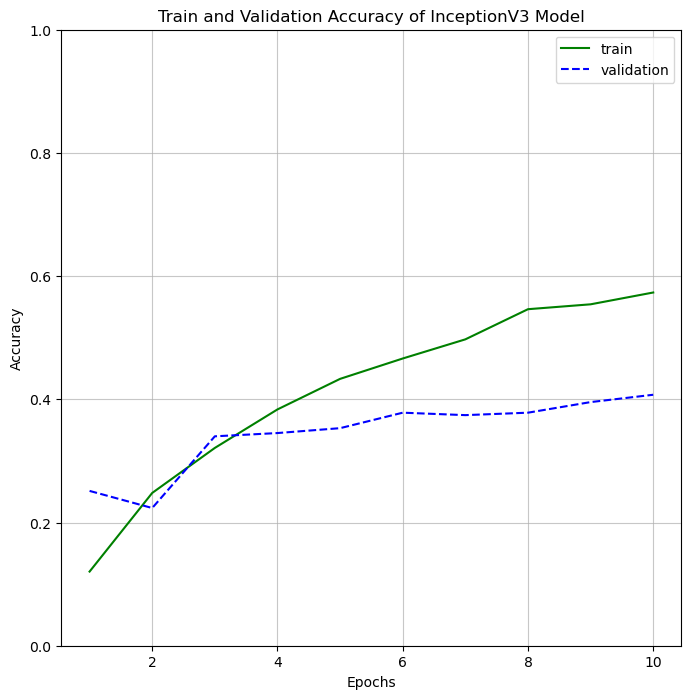

In [31]:
plot_accuracy(epoch_inceptionv3, result_inceptionv3.history, 'InceptionV3')

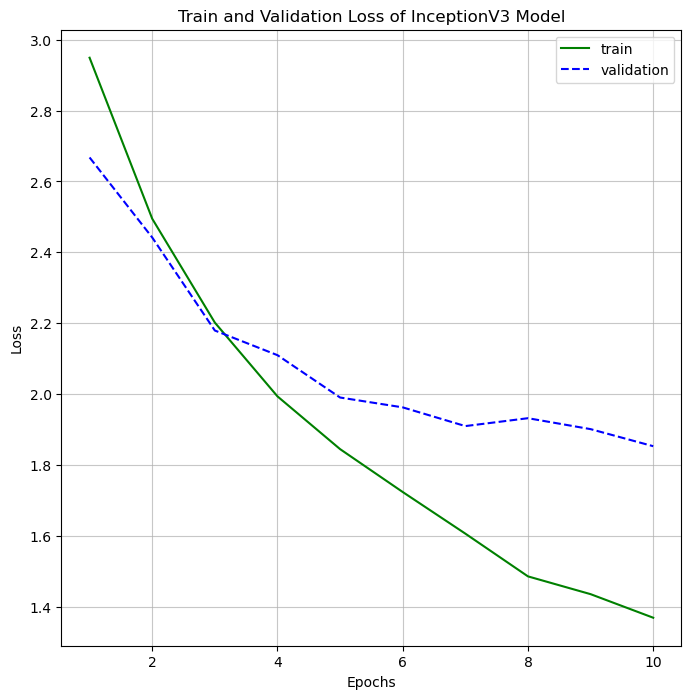

In [32]:
plot_loss(epoch_inceptionv3, result_inceptionv3.history, 'InceptionV3')

1/1 [==============================] - 1s 1s/step


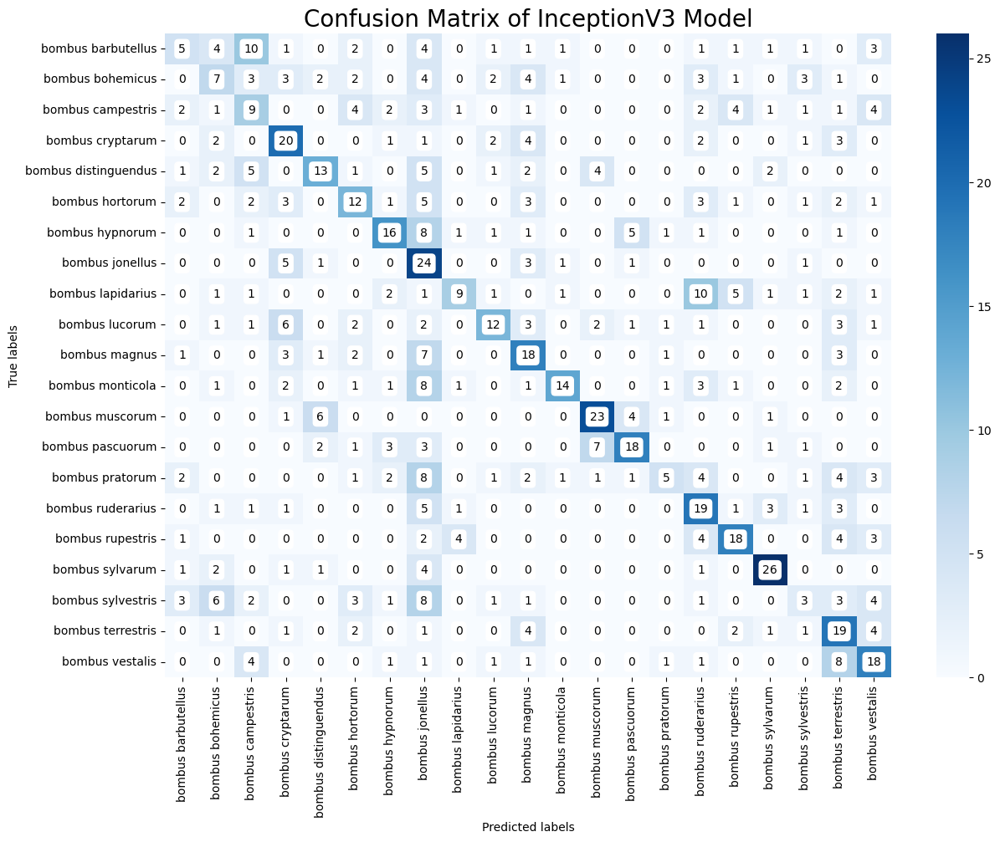

In [37]:
plot_confusion_matrix(model_inceptionv3, validate_batches_incep, 'InceptionV3')

1/1 [==============================] - 0s 364ms/step


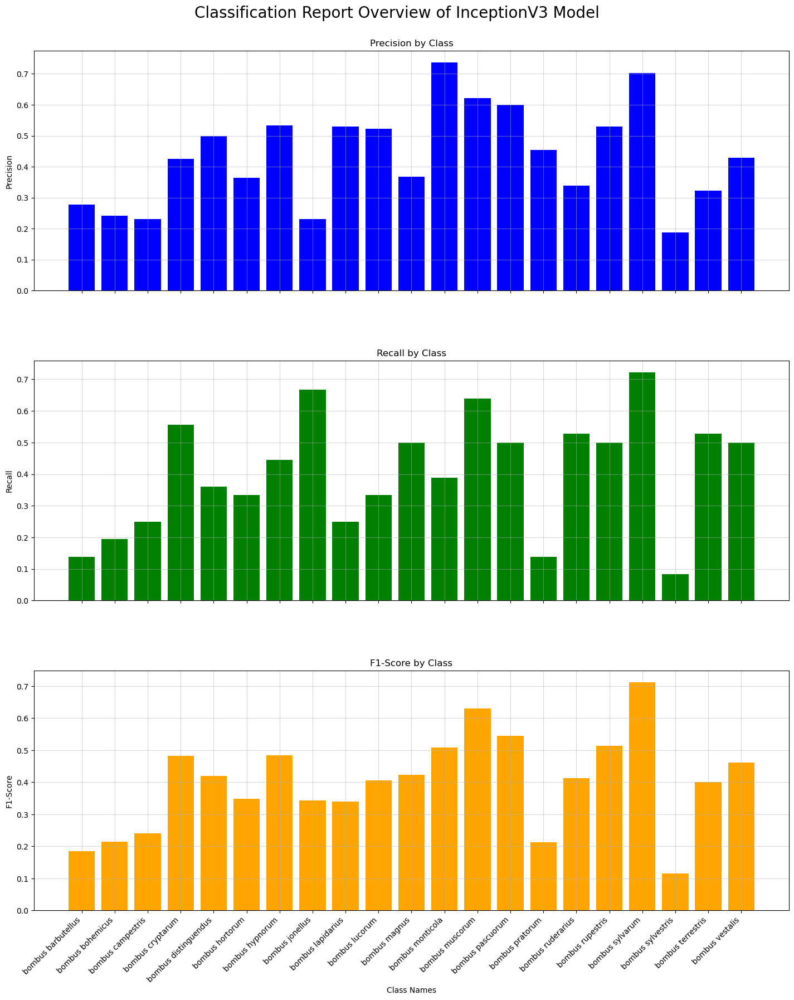

In [39]:
plot_classification_report(model_inceptionv3, validate_batches_incep, 'InceptionV3')

In [41]:
print_classification_report(model_inceptionv3, validate_batches_incep)

1/1 [==============================] - 0s 348ms/step
Classification Report:
                       precision    recall  f1-score   support

  bombus barbutellus       0.28      0.14      0.19        36
    bombus bohemicus       0.24      0.19      0.22        36
   bombus campestris       0.23      0.25      0.24        36
    bombus cryptarum       0.43      0.56      0.48        36
bombus distinguendus       0.50      0.36      0.42        36
     bombus hortorum       0.36      0.33      0.35        36
     bombus hypnorum       0.53      0.44      0.48        36
     bombus jonellus       0.23      0.67      0.34        36
   bombus lapidarius       0.53      0.25      0.34        36
      bombus lucorum       0.52      0.33      0.41        36
       bombus magnus       0.37      0.50      0.42        36
    bombus monticola       0.74      0.39      0.51        36
     bombus muscorum       0.62      0.64      0.63        36
    bombus pascuorum       0.60      0.50      0.55   

1/1 [==============================] - 0s 352ms/step


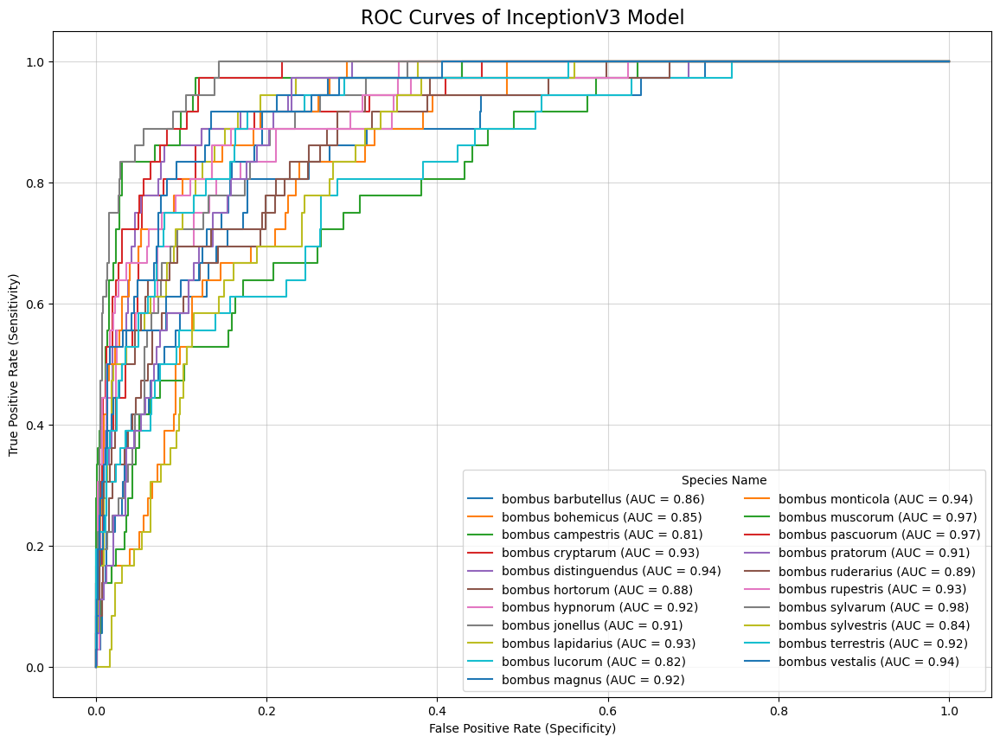

In [48]:
plot_roc_curves(model_inceptionv3, validate_batches_incep, 'InceptionV3')

### 2.1.2. ResNet101

In [95]:
# Specify image size and batch size
img_height_resnet, img_width_resnet = (224, 224)
batch_size = 32

In [96]:
train_batches_resnet = ImageDataGenerator(preprocessing_function=
                                         tf.keras.applications.resnet.preprocess_input) \
                    .flow_from_directory(training_data_dir, target_size=(img_height_resnet, img_width_resnet),
                                         batch_size=batch_size, class_mode='categorical', 
                                         shuffle=True)

Found 3024 images belonging to 21 classes.


In [97]:
validate_batches_resnet = ImageDataGenerator(preprocessing_function=
                                            tf.keras.applications.resnet.preprocess_input) \
                    .flow_from_directory(validate_data_dir, target_size=(img_height_resnet, img_width_resnet),
                                         batch_size=batch_size, class_mode='categorical', 
                                         shuffle=True)

Found 756 images belonging to 21 classes.


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

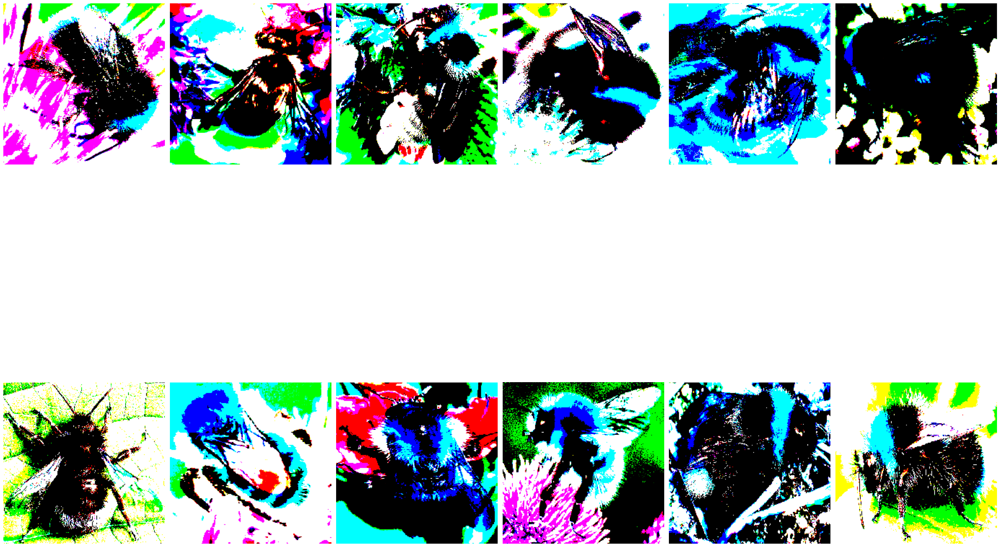

[[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0.]
 [1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 1.

In [98]:
imgs, labels = next(train_batches_resnet)

plotImages(imgs)
print(labels)

In [99]:
resnet101 = tf.keras.applications.ResNet101(
    include_top=False,
    input_shape=(224, 224, 3),
    pooling='avg',
    weights='imagenet')

for layer in resnet101.layers:
        layer.trainable=False

In [100]:
resnet101.summary()

Model: "resnet101"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_7 (InputLayer)        [(None, 224, 224, 3)]        0         []                            
                                                                                                  
 conv1_pad (ZeroPadding2D)   (None, 230, 230, 3)          0         ['input_7[0][0]']             
                                                                                                  
 conv1_conv (Conv2D)         (None, 112, 112, 64)         9472      ['conv1_pad[0][0]']           
                                                                                                  
 conv1_bn (BatchNormalizati  (None, 112, 112, 64)         256       ['conv1_conv[0][0]']          
 on)                                                                                      

                                                                                                  
 conv2_block3_1_conv (Conv2  (None, 56, 56, 64)           16448     ['conv2_block2_out[0][0]']    
 D)                                                                                               
                                                                                                  
 conv2_block3_1_bn (BatchNo  (None, 56, 56, 64)           256       ['conv2_block3_1_conv[0][0]'] 
 rmalization)                                                                                     
                                                                                                  
 conv2_block3_1_relu (Activ  (None, 56, 56, 64)           0         ['conv2_block3_1_bn[0][0]']   
 ation)                                                                                           
                                                                                                  
 conv2_blo

 ation)                                                                                           
                                                                                                  
 conv3_block2_3_conv (Conv2  (None, 28, 28, 512)          66048     ['conv3_block2_2_relu[0][0]'] 
 D)                                                                                               
                                                                                                  
 conv3_block2_3_bn (BatchNo  (None, 28, 28, 512)          2048      ['conv3_block2_3_conv[0][0]'] 
 rmalization)                                                                                     
                                                                                                  
 conv3_block2_add (Add)      (None, 28, 28, 512)          0         ['conv3_block1_out[0][0]',    
                                                                     'conv3_block2_3_bn[0][0]']   
          

 conv4_block1_2_conv (Conv2  (None, 14, 14, 256)          590080    ['conv4_block1_1_relu[0][0]'] 
 D)                                                                                               
                                                                                                  
 conv4_block1_2_bn (BatchNo  (None, 14, 14, 256)          1024      ['conv4_block1_2_conv[0][0]'] 
 rmalization)                                                                                     
                                                                                                  
 conv4_block1_2_relu (Activ  (None, 14, 14, 256)          0         ['conv4_block1_2_bn[0][0]']   
 ation)                                                                                           
                                                                                                  
 conv4_block1_0_conv (Conv2  (None, 14, 14, 1024)         525312    ['conv3_block4_out[0][0]']    
 D)       

                                                                                                  
 conv4_block3_out (Activati  (None, 14, 14, 1024)         0         ['conv4_block3_add[0][0]']    
 on)                                                                                              
                                                                                                  
 conv4_block4_1_conv (Conv2  (None, 14, 14, 256)          262400    ['conv4_block3_out[0][0]']    
 D)                                                                                               
                                                                                                  
 conv4_block4_1_bn (BatchNo  (None, 14, 14, 256)          1024      ['conv4_block4_1_conv[0][0]'] 
 rmalization)                                                                                     
                                                                                                  
 conv4_blo

 D)                                                                                               
                                                                                                  
 conv4_block6_3_bn (BatchNo  (None, 14, 14, 1024)         4096      ['conv4_block6_3_conv[0][0]'] 
 rmalization)                                                                                     
                                                                                                  
 conv4_block6_add (Add)      (None, 14, 14, 1024)         0         ['conv4_block5_out[0][0]',    
                                                                     'conv4_block6_3_bn[0][0]']   
                                                                                                  
 conv4_block6_out (Activati  (None, 14, 14, 1024)         0         ['conv4_block6_add[0][0]']    
 on)                                                                                              
          

 conv4_block9_2_bn (BatchNo  (None, 14, 14, 256)          1024      ['conv4_block9_2_conv[0][0]'] 
 rmalization)                                                                                     
                                                                                                  
 conv4_block9_2_relu (Activ  (None, 14, 14, 256)          0         ['conv4_block9_2_bn[0][0]']   
 ation)                                                                                           
                                                                                                  
 conv4_block9_3_conv (Conv2  (None, 14, 14, 1024)         263168    ['conv4_block9_2_relu[0][0]'] 
 D)                                                                                               
                                                                                                  
 conv4_block9_3_bn (BatchNo  (None, 14, 14, 1024)         4096      ['conv4_block9_3_conv[0][0]'] 
 rmalizati

                                                                                                  
 conv4_block12_1_relu (Acti  (None, 14, 14, 256)          0         ['conv4_block12_1_bn[0][0]']  
 vation)                                                                                          
                                                                                                  
 conv4_block12_2_conv (Conv  (None, 14, 14, 256)          590080    ['conv4_block12_1_relu[0][0]']
 2D)                                                                                              
                                                                                                  
 conv4_block12_2_bn (BatchN  (None, 14, 14, 256)          1024      ['conv4_block12_2_conv[0][0]']
 ormalization)                                                                                    
                                                                                                  
 conv4_blo

 ion)                                                                                             
                                                                                                  
 conv4_block15_1_conv (Conv  (None, 14, 14, 256)          262400    ['conv4_block14_out[0][0]']   
 2D)                                                                                              
                                                                                                  
 conv4_block15_1_bn (BatchN  (None, 14, 14, 256)          1024      ['conv4_block15_1_conv[0][0]']
 ormalization)                                                                                    
                                                                                                  
 conv4_block15_1_relu (Acti  (None, 14, 14, 256)          0         ['conv4_block15_1_bn[0][0]']  
 vation)                                                                                          
          

 conv4_block17_3_bn (BatchN  (None, 14, 14, 1024)         4096      ['conv4_block17_3_conv[0][0]']
 ormalization)                                                                                    
                                                                                                  
 conv4_block17_add (Add)     (None, 14, 14, 1024)         0         ['conv4_block16_out[0][0]',   
                                                                     'conv4_block17_3_bn[0][0]']  
                                                                                                  
 conv4_block17_out (Activat  (None, 14, 14, 1024)         0         ['conv4_block17_add[0][0]']   
 ion)                                                                                             
                                                                                                  
 conv4_block18_1_conv (Conv  (None, 14, 14, 256)          262400    ['conv4_block17_out[0][0]']   
 2D)      

                                                                                                  
 conv4_block20_2_relu (Acti  (None, 14, 14, 256)          0         ['conv4_block20_2_bn[0][0]']  
 vation)                                                                                          
                                                                                                  
 conv4_block20_3_conv (Conv  (None, 14, 14, 1024)         263168    ['conv4_block20_2_relu[0][0]']
 2D)                                                                                              
                                                                                                  
 conv4_block20_3_bn (BatchN  (None, 14, 14, 1024)         4096      ['conv4_block20_3_conv[0][0]']
 ormalization)                                                                                    
                                                                                                  
 conv4_blo

 vation)                                                                                          
                                                                                                  
 conv4_block23_2_conv (Conv  (None, 14, 14, 256)          590080    ['conv4_block23_1_relu[0][0]']
 2D)                                                                                              
                                                                                                  
 conv4_block23_2_bn (BatchN  (None, 14, 14, 256)          1024      ['conv4_block23_2_conv[0][0]']
 ormalization)                                                                                    
                                                                                                  
 conv4_block23_2_relu (Acti  (None, 14, 14, 256)          0         ['conv4_block23_2_bn[0][0]']  
 vation)                                                                                          
          

 conv5_block2_add (Add)      (None, 7, 7, 2048)           0         ['conv5_block1_out[0][0]',    
                                                                     'conv5_block2_3_bn[0][0]']   
                                                                                                  
 conv5_block2_out (Activati  (None, 7, 7, 2048)           0         ['conv5_block2_add[0][0]']    
 on)                                                                                              
                                                                                                  
 conv5_block3_1_conv (Conv2  (None, 7, 7, 512)            1049088   ['conv5_block2_out[0][0]']    
 D)                                                                                               
                                                                                                  
 conv5_block3_1_bn (BatchNo  (None, 7, 7, 512)            2048      ['conv5_block3_1_conv[0][0]'] 
 rmalizati

In [101]:
model_resnet101 = Sequential()

model_resnet101.add(resnet101)
model_resnet101.add(Flatten())
model_resnet101.add(Dense(512, activation='relu'))
model_resnet101.add(Dropout(0.2))
model_resnet101.add(Dense(21, activation='softmax'))

In [102]:
model_resnet101.summary()

Model: "sequential_4"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 resnet101 (Functional)      (None, 2048)              42658176  
                                                                 
 flatten_4 (Flatten)         (None, 2048)              0         
                                                                 
 dense_8 (Dense)             (None, 512)               1049088   
                                                                 
 dropout_4 (Dropout)         (None, 512)               0         
                                                                 
 dense_9 (Dense)             (None, 21)                10773     
                                                                 
Total params: 43718037 (166.77 MB)
Trainable params: 1059861 (4.04 MB)
Non-trainable params: 42658176 (162.73 MB)
_________________________________________________________________


In [103]:
model_resnet101.compile(optimizer=Adam(learning_rate=0.001),
                        loss='categorical_crossentropy',
                        metrics=['accuracy'])

In [104]:
epoch_resnet101 = 15

result_resnet101 = model_resnet101.fit(train_batches_resnet,
                                       validation_data=validate_batches_resnet,
                                       epochs=epoch_resnet101,
                                       verbose=2)

Epoch 1/15
95/95 - 119s - loss: 2.5383 - accuracy: 0.2579 - val_loss: 1.8379 - val_accuracy: 0.4246 - 119s/epoch - 1s/step
Epoch 2/15
95/95 - 114s - loss: 1.6552 - accuracy: 0.4792 - val_loss: 1.6512 - val_accuracy: 0.4709 - 114s/epoch - 1s/step
Epoch 3/15
95/95 - 115s - loss: 1.2785 - accuracy: 0.5929 - val_loss: 1.5216 - val_accuracy: 0.5278 - 115s/epoch - 1s/step
Epoch 4/15
95/95 - 116s - loss: 1.0452 - accuracy: 0.6736 - val_loss: 1.4471 - val_accuracy: 0.5437 - 116s/epoch - 1s/step
Epoch 5/15
95/95 - 115s - loss: 0.8788 - accuracy: 0.7140 - val_loss: 1.4013 - val_accuracy: 0.5569 - 115s/epoch - 1s/step
Epoch 6/15
95/95 - 115s - loss: 0.6956 - accuracy: 0.7834 - val_loss: 1.3349 - val_accuracy: 0.5807 - 115s/epoch - 1s/step
Epoch 7/15
95/95 - 116s - loss: 0.5850 - accuracy: 0.8165 - val_loss: 1.3356 - val_accuracy: 0.5661 - 116s/epoch - 1s/step
Epoch 8/15
95/95 - 118s - loss: 0.4844 - accuracy: 0.8558 - val_loss: 1.2508 - val_accuracy: 0.6111 - 118s/epoch - 1s/step
Epoch 9/15
95/95

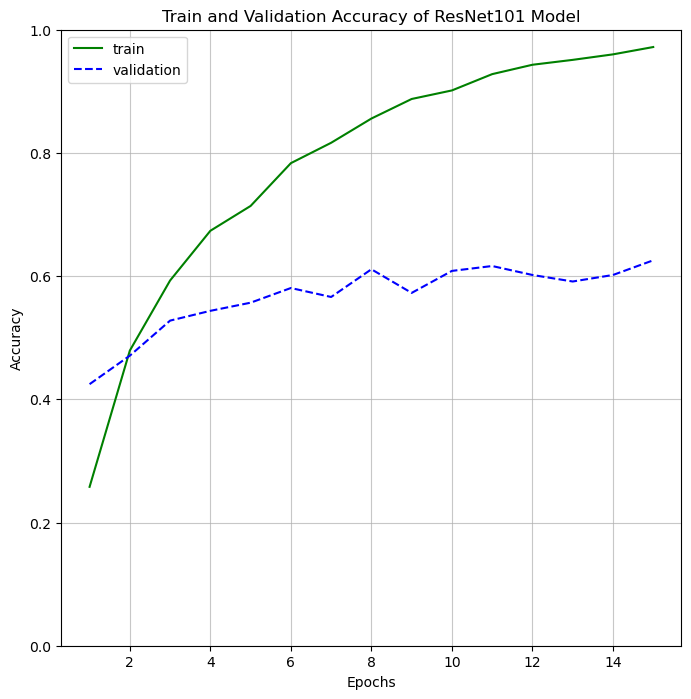

In [105]:
plot_accuracy(epoch_resnet101, result_resnet101.history, 'ResNet101')

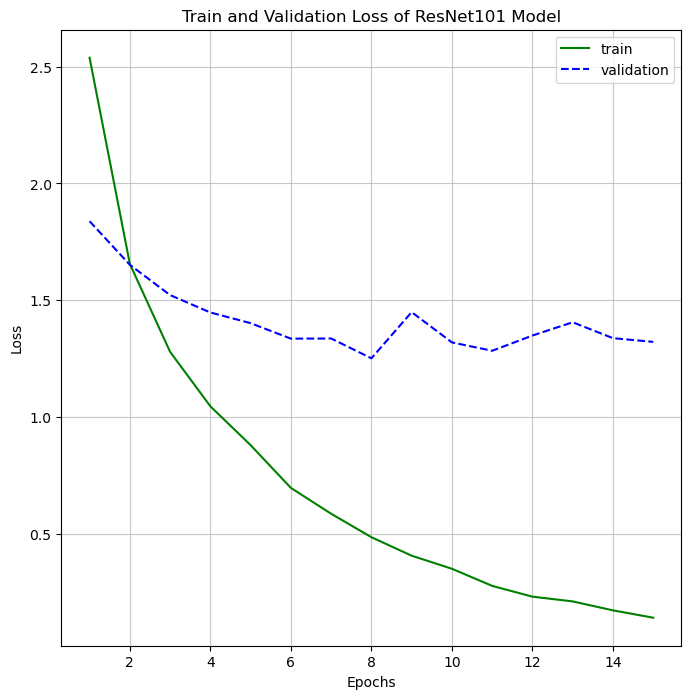

In [106]:
plot_loss(epoch_resnet101, result_resnet101.history, 'ResNet101')

### 2.1.3. VGG19

In [133]:
# Specify image size and batch size
img_height_vgg, img_width_vgg = (224, 224)
batch_size = 32

In [134]:
train_batches_vgg = ImageDataGenerator(preprocessing_function=
                                       tf.keras.applications.vgg19.preprocess_input) \
                    .flow_from_directory(training_data_dir, target_size=(img_height_vgg, img_width_vgg),
                                         batch_size=batch_size, class_mode='categorical', 
                                         shuffle=True)

Found 3024 images belonging to 21 classes.


In [135]:
validate_batches_vgg = ImageDataGenerator(preprocessing_function=
                                          tf.keras.applications.vgg19.preprocess_input) \
                    .flow_from_directory(validate_data_dir, target_size=(img_height_vgg, img_width_vgg),
                                         batch_size=batch_size, class_mode='categorical', 
                                         shuffle=True)

Found 756 images belonging to 21 classes.


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

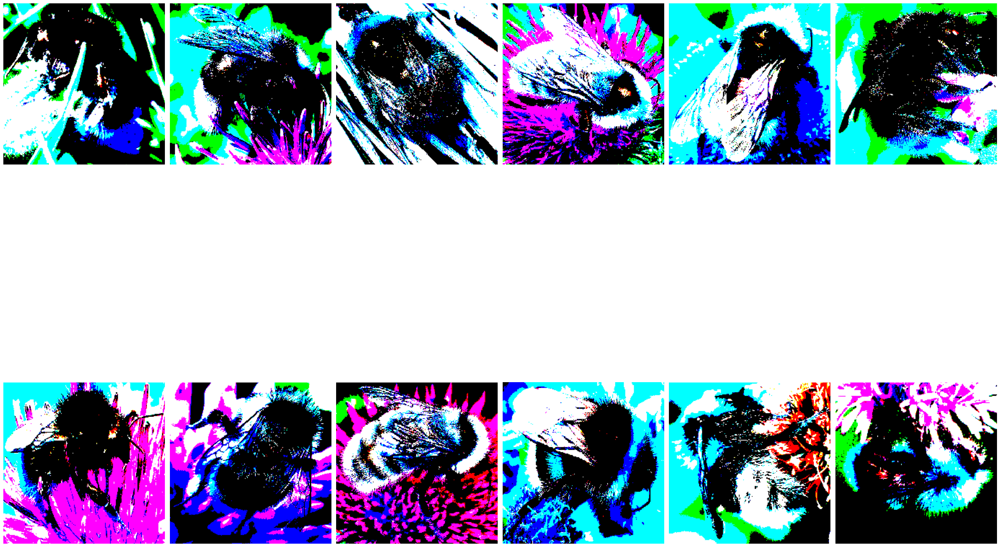

[[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
 [0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0.]
 [0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]
 [0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
 [0. 0. 0.

In [136]:
imgs, labels = next(train_batches_vgg)

plotImages(imgs)
print(labels)

In [137]:
vgg19 = tf.keras.applications.VGG19(
    include_top=False,
    input_shape=(224, 224, 3),
    pooling='avg',
    weights='imagenet')

for layer in vgg19.layers:
        layer.trainable=False

In [138]:
vgg19.summary()

Model: "vgg19"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_11 (InputLayer)       [(None, 224, 224, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 224, 224, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 224, 224, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 112, 112, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 112, 112, 128)     73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 112, 112, 128)     147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, 56, 56, 128)       0     

In [140]:
model_vgg19 = Sequential()

model_vgg19.add(vgg19)
model_vgg19.add(Flatten())
model_vgg19.add(Dense(512, activation='relu'))
model_vgg19.add(Dropout(0.2))
model_vgg19.add(Dense(21, activation='softmax'))

In [141]:
model_vgg19.summary()

Model: "sequential_7"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 vgg19 (Functional)          (None, 512)               20024384  
                                                                 
 flatten_7 (Flatten)         (None, 512)               0         
                                                                 
 dense_14 (Dense)            (None, 512)               262656    
                                                                 
 dropout_7 (Dropout)         (None, 512)               0         
                                                                 
 dense_15 (Dense)            (None, 21)                10773     
                                                                 
Total params: 20297813 (77.43 MB)
Trainable params: 273429 (1.04 MB)
Non-trainable params: 20024384 (76.39 MB)
_________________________________________________________________


In [142]:
model_vgg19.compile(optimizer=Adam(learning_rate=0.001),
                    loss='categorical_crossentropy',
                    metrics=['accuracy'])

In [143]:
epoch_vgg19 = 10

result_vgg19 = model_vgg19.fit(train_batches_vgg,
                               validation_data=validate_batches_vgg,
                               epochs=epoch_vgg19,
                               verbose=2)

Epoch 1/10
95/95 - 213s - loss: 4.1363 - accuracy: 0.1584 - val_loss: 2.3152 - val_accuracy: 0.2976 - 213s/epoch - 2s/step
Epoch 2/10
95/95 - 222s - loss: 2.0861 - accuracy: 0.3538 - val_loss: 2.0705 - val_accuracy: 0.3704 - 222s/epoch - 2s/step
Epoch 3/10
95/95 - 224s - loss: 1.7431 - accuracy: 0.4590 - val_loss: 1.9757 - val_accuracy: 0.3876 - 224s/epoch - 2s/step
Epoch 4/10
95/95 - 2521s - loss: 1.4316 - accuracy: 0.5403 - val_loss: 1.8673 - val_accuracy: 0.4206 - 2521s/epoch - 27s/step
Epoch 5/10
95/95 - 257s - loss: 1.2076 - accuracy: 0.6204 - val_loss: 1.7808 - val_accuracy: 0.4656 - 257s/epoch - 3s/step
Epoch 6/10
95/95 - 257s - loss: 1.0254 - accuracy: 0.6624 - val_loss: 1.7901 - val_accuracy: 0.4339 - 257s/epoch - 3s/step
Epoch 7/10
95/95 - 258s - loss: 0.8526 - accuracy: 0.7298 - val_loss: 1.7931 - val_accuracy: 0.4603 - 258s/epoch - 3s/step
Epoch 8/10
95/95 - 258s - loss: 0.7314 - accuracy: 0.7728 - val_loss: 1.7525 - val_accuracy: 0.4616 - 258s/epoch - 3s/step
Epoch 9/10
95

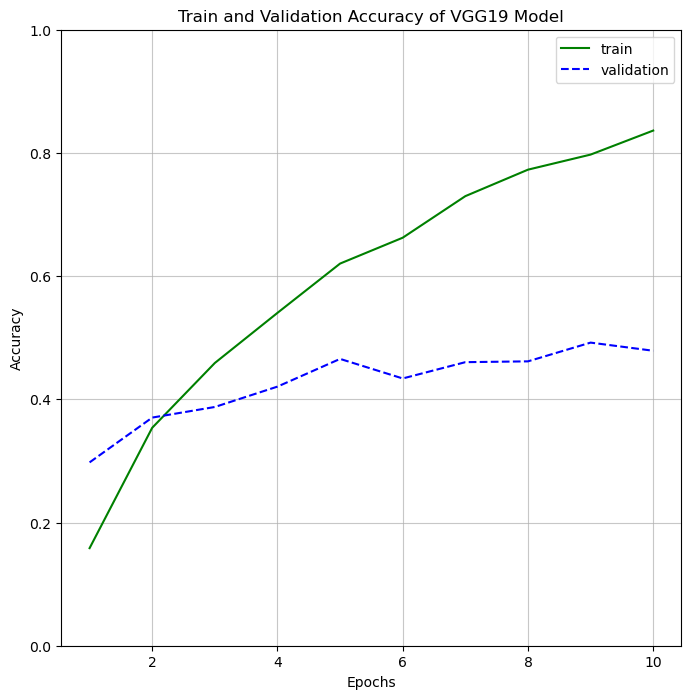

In [144]:
plot_accuracy(epoch_vgg19, result_vgg19.history, 'VGG19')

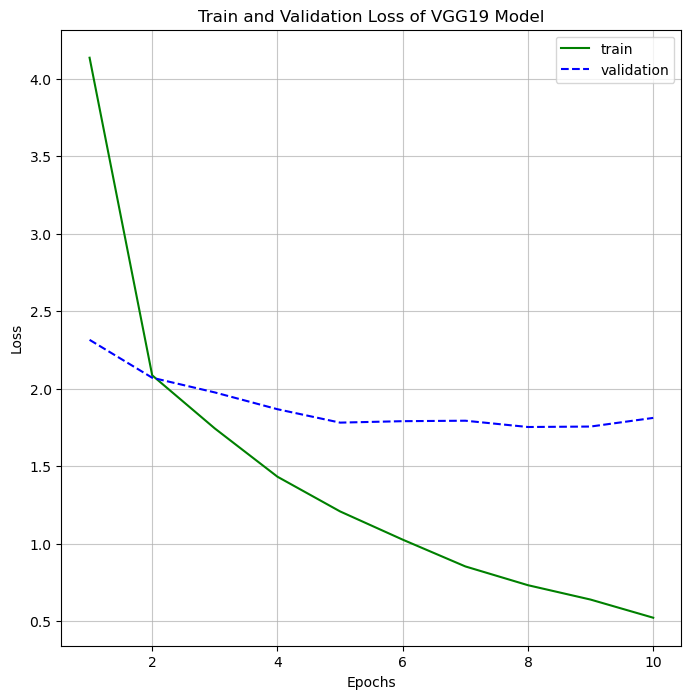

In [145]:
plot_loss(epoch_vgg19, result_vgg19.history, 'VGG19')

### 2.1.4. MobileNetV3Large

In [156]:
# Specify image size and batch size
img_height_mob, img_width_mob = (224, 224)
batch_size = 32

In [157]:
train_batches_mob = ImageDataGenerator(preprocessing_function=
                                       tf.keras.applications.mobilenet_v3.preprocess_input) \
                    .flow_from_directory(training_data_dir, target_size=(img_height_mob, img_width_mob),
                                         batch_size=batch_size, class_mode='categorical', 
                                         shuffle=True)

Found 3024 images belonging to 21 classes.


In [158]:
validate_batches_mob = ImageDataGenerator(preprocessing_function=
                                       tf.keras.applications.mobilenet_v3.preprocess_input) \
                    .flow_from_directory(validate_data_dir, target_size=(img_height_mob, img_width_mob),
                                         batch_size=batch_size, class_mode='categorical', 
                                         shuffle=True)

Found 756 images belonging to 21 classes.


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

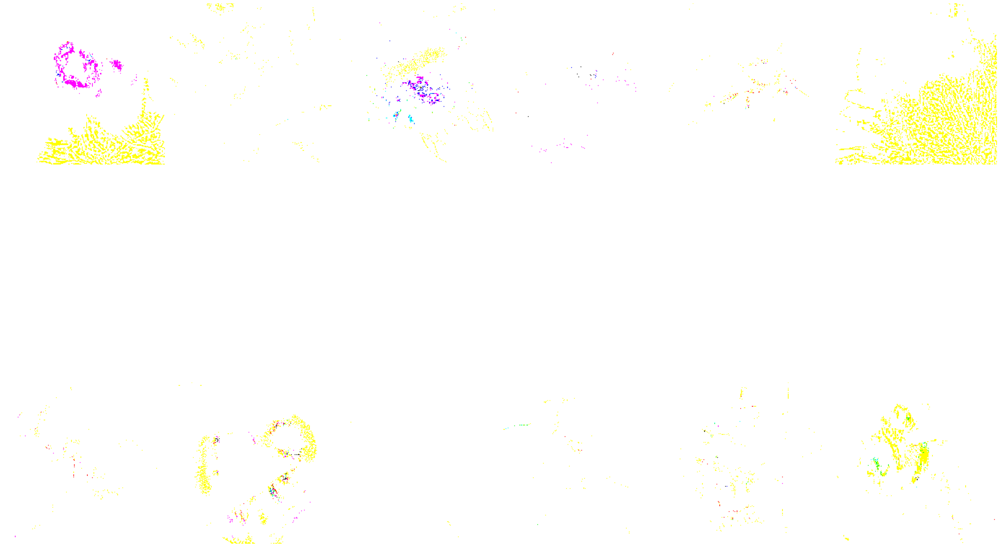

[[0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
 [1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
 [0. 0. 0.

In [159]:
imgs, labels = next(train_batches_mob)

plotImages(imgs)
print(labels)

In [160]:
mobilenetv3 = tf.keras.applications.MobileNetV3Large(
    include_top=False,
    input_shape=(224, 224, 3),
    pooling='avg',
    weights='imagenet')

for layer in mobilenetv3.layers:
        layer.trainable=False

In [161]:
mobilenetv3.summary()

Model: "MobilenetV3large"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_13 (InputLayer)       [(None, 224, 224, 3)]        0         []                            
                                                                                                  
 rescaling_3 (Rescaling)     (None, 224, 224, 3)          0         ['input_13[0][0]']            
                                                                                                  
 Conv (Conv2D)               (None, 112, 112, 16)         432       ['rescaling_3[0][0]']         
                                                                                                  
 Conv/BatchNorm (BatchNorma  (None, 112, 112, 16)         64        ['Conv[0][0]']                
 lization)                                                                         

 expanded_conv_2/depthwise   (None, 56, 56, 72)           648       ['re_lu_4[0][0]']             
 (DepthwiseConv2D)                                                                                
                                                                                                  
 expanded_conv_2/depthwise/  (None, 56, 56, 72)           288       ['expanded_conv_2/depthwise[0]
 BatchNorm (BatchNormalizat                                         [0]']                         
 ion)                                                                                             
                                                                                                  
 re_lu_5 (ReLU)              (None, 56, 56, 72)           0         ['expanded_conv_2/depthwise/Ba
                                                                    tchNorm[0][0]']               
                                                                                                  
 expanded_

                                                                                                  
 re_lu_9 (ReLU)              (None, 28, 28, 120)          0         ['expanded_conv_4/expand/Batch
                                                                    Norm[0][0]']                  
                                                                                                  
 expanded_conv_4/depthwise   (None, 28, 28, 120)          3000      ['re_lu_9[0][0]']             
 (DepthwiseConv2D)                                                                                
                                                                                                  
 expanded_conv_4/depthwise/  (None, 28, 28, 120)          480       ['expanded_conv_4/depthwise[0]
 BatchNorm (BatchNormalizat                                         [0]']                         
 ion)                                                                                             
          

                                                                                                  
 tf.__operators__.add_3 (TF  (None, 1, 1, 120)            0         ['expanded_conv_5/squeeze_exci
 OpLambda)                                                          te/Conv_1[0][0]']             
                                                                                                  
 re_lu_14 (ReLU)             (None, 1, 1, 120)            0         ['tf.__operators__.add_3[0][0]
                                                                    ']                            
                                                                                                  
 tf.math.multiply_3 (TFOpLa  (None, 1, 1, 120)            0         ['re_lu_14[0][0]']            
 mbda)                                                                                            
                                                                                                  
 expanded_

                                                                                                  
 re_lu_17 (ReLU)             (None, 14, 14, 200)          0         ['tf.__operators__.add_6[0][0]
                                                                    ']                            
                                                                                                  
 tf.math.multiply_6 (TFOpLa  (None, 14, 14, 200)          0         ['re_lu_17[0][0]']            
 mbda)                                                                                            
                                                                                                  
 multiply_3 (Multiply)       (None, 14, 14, 200)          0         ['expanded_conv_7/expand/Batch
                                                                    Norm[0][0]',                  
                                                                     'tf.math.multiply_6[0][0]']  
          

 expanded_conv_8/project (C  (None, 14, 14, 80)           14720     ['multiply_6[0][0]']          
 onv2D)                                                                                           
                                                                                                  
 expanded_conv_8/project/Ba  (None, 14, 14, 80)           320       ['expanded_conv_8/project[0][0
 tchNorm (BatchNormalizatio                                         ]']                           
 n)                                                                                               
                                                                                                  
 expanded_conv_8/Add (Add)   (None, 14, 14, 80)           0         ['expanded_conv_7/Add[0][0]', 
                                                                     'expanded_conv_8/project/Batc
                                                                    hNorm[0][0]']                 
          

  (DepthwiseConv2D)                                                                               
                                                                                                  
 expanded_conv_10/depthwise  (None, 14, 14, 480)          1920      ['expanded_conv_10/depthwise[0
 /BatchNorm (BatchNormaliza                                         ][0]']                        
 tion)                                                                                            
                                                                                                  
 tf.__operators__.add_13 (T  (None, 14, 14, 480)          0         ['expanded_conv_10/depthwise/B
 FOpLambda)                                                         atchNorm[0][0]']              
                                                                                                  
 re_lu_24 (ReLU)             (None, 14, 14, 480)          0         ['tf.__operators__.add_13[0][0
          

                                                                                                  
 tf.math.multiply_16 (TFOpL  (None, 14, 14, 672)          0         ['re_lu_27[0][0]']            
 ambda)                                                                                           
                                                                                                  
 multiply_12 (Multiply)      (None, 14, 14, 672)          0         ['expanded_conv_11/depthwise/B
                                                                    atchNorm[0][0]',              
                                                                     'tf.math.multiply_16[0][0]'] 
                                                                                                  
 expanded_conv_11/squeeze_e  (None, 1, 1, 672)            0         ['multiply_12[0][0]']         
 xcite/AvgPool (GlobalAvera                                                                       
 gePooling

                                                                                                  
 multiply_14 (Multiply)      (None, 7, 7, 672)            0         ['expanded_conv_12/depthwise/B
                                                                    atchNorm[0][0]',              
                                                                     'tf.math.multiply_19[0][0]'] 
                                                                                                  
 expanded_conv_12/squeeze_e  (None, 1, 1, 672)            0         ['multiply_14[0][0]']         
 xcite/AvgPool (GlobalAvera                                                                       
 gePooling2D)                                                                                     
                                                                                                  
 expanded_conv_12/squeeze_e  (None, 1, 1, 168)            113064    ['expanded_conv_12/squeeze_exc
 xcite/Con

                                                                                                  
 expanded_conv_13/squeeze_e  (None, 1, 1, 240)            0         ['expanded_conv_13/squeeze_exc
 xcite/Relu (ReLU)                                                  ite/Conv[0][0]']              
                                                                                                  
 expanded_conv_13/squeeze_e  (None, 1, 1, 960)            231360    ['expanded_conv_13/squeeze_exc
 xcite/Conv_1 (Conv2D)                                              ite/Relu[0][0]']              
                                                                                                  
 tf.__operators__.add_23 (T  (None, 1, 1, 960)            0         ['expanded_conv_13/squeeze_exc
 FOpLambda)                                                         ite/Conv_1[0][0]']            
                                                                                                  
 re_lu_34 

                                                                                                  
 tf.__operators__.add_26 (T  (None, 1, 1, 960)            0         ['expanded_conv_14/squeeze_exc
 FOpLambda)                                                         ite/Conv_1[0][0]']            
                                                                                                  
 re_lu_37 (ReLU)             (None, 1, 1, 960)            0         ['tf.__operators__.add_26[0][0
                                                                    ]']                           
                                                                                                  
 tf.math.multiply_26 (TFOpL  (None, 1, 1, 960)            0         ['re_lu_37[0][0]']            
 ambda)                                                                                           
                                                                                                  
 expanded_

In [162]:
model_mobilenetv3 = Sequential()

model_mobilenetv3.add(mobilenetv3)
model_mobilenetv3.add(Flatten())
model_mobilenetv3.add(Dense(512, activation='relu'))
model_mobilenetv3.add(Dropout(0.2))
model_mobilenetv3.add(Dense(21, activation='softmax'))

In [163]:
model_mobilenetv3.summary()

Model: "sequential_9"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 MobilenetV3large (Function  (None, 960)               2996352   
 al)                                                             
                                                                 
 flatten_9 (Flatten)         (None, 960)               0         
                                                                 
 dense_18 (Dense)            (None, 512)               492032    
                                                                 
 dropout_9 (Dropout)         (None, 512)               0         
                                                                 
 dense_19 (Dense)            (None, 21)                10773     
                                                                 
Total params: 3499157 (13.35 MB)
Trainable params: 502805 (1.92 MB)
Non-trainable params: 2996352 (11.43 MB)
___________

In [164]:
model_mobilenetv3.compile(optimizer=Adam(learning_rate=0.001),
                          loss='categorical_crossentropy',
                          metrics=['accuracy'])

In [165]:
epoch_mobilenetv3 = 10

result_mobilenetv3 = model_mobilenetv3.fit(train_batches_mob,
                                           validation_data=validate_batches_mob,
                                           epochs=epoch_mobilenetv3,
                                           verbose=2)

Epoch 1/10
95/95 - 22s - loss: 2.5123 - accuracy: 0.2593 - val_loss: 1.9429 - val_accuracy: 0.4061 - 22s/epoch - 232ms/step
Epoch 2/10
95/95 - 19s - loss: 1.6423 - accuracy: 0.4974 - val_loss: 1.5717 - val_accuracy: 0.5159 - 19s/epoch - 196ms/step
Epoch 3/10
95/95 - 19s - loss: 1.2610 - accuracy: 0.6147 - val_loss: 1.4889 - val_accuracy: 0.5172 - 19s/epoch - 196ms/step
Epoch 4/10
95/95 - 19s - loss: 1.0512 - accuracy: 0.6663 - val_loss: 1.3496 - val_accuracy: 0.5847 - 19s/epoch - 195ms/step
Epoch 5/10
95/95 - 18s - loss: 0.8887 - accuracy: 0.7235 - val_loss: 1.2616 - val_accuracy: 0.5939 - 18s/epoch - 191ms/step
Epoch 6/10
95/95 - 19s - loss: 0.7341 - accuracy: 0.7722 - val_loss: 1.2670 - val_accuracy: 0.6085 - 19s/epoch - 195ms/step
Epoch 7/10
95/95 - 18s - loss: 0.6050 - accuracy: 0.8148 - val_loss: 1.1814 - val_accuracy: 0.6019 - 18s/epoch - 194ms/step
Epoch 8/10
95/95 - 18s - loss: 0.5105 - accuracy: 0.8482 - val_loss: 1.2074 - val_accuracy: 0.6177 - 18s/epoch - 195ms/step
Epoch 9/

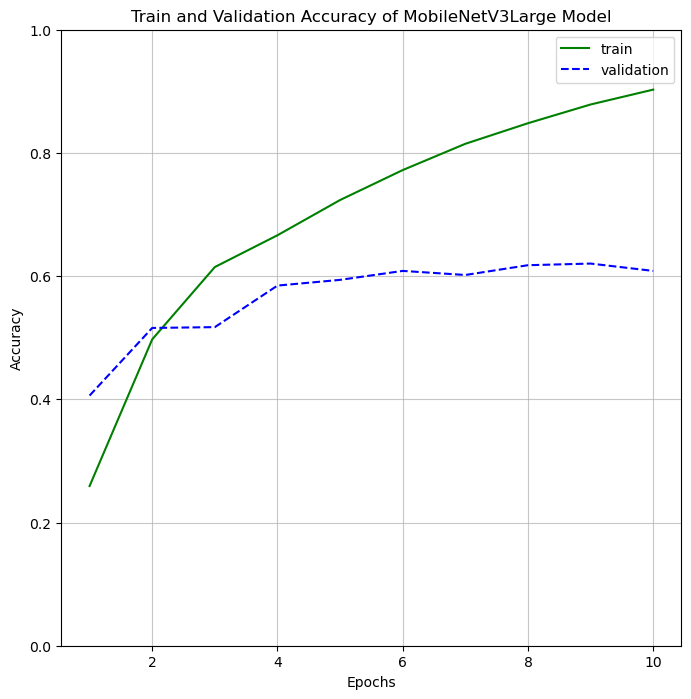

In [166]:
plot_accuracy(epoch_mobilenetv3, result_mobilenetv3.history, 'MobileNetV3Large')

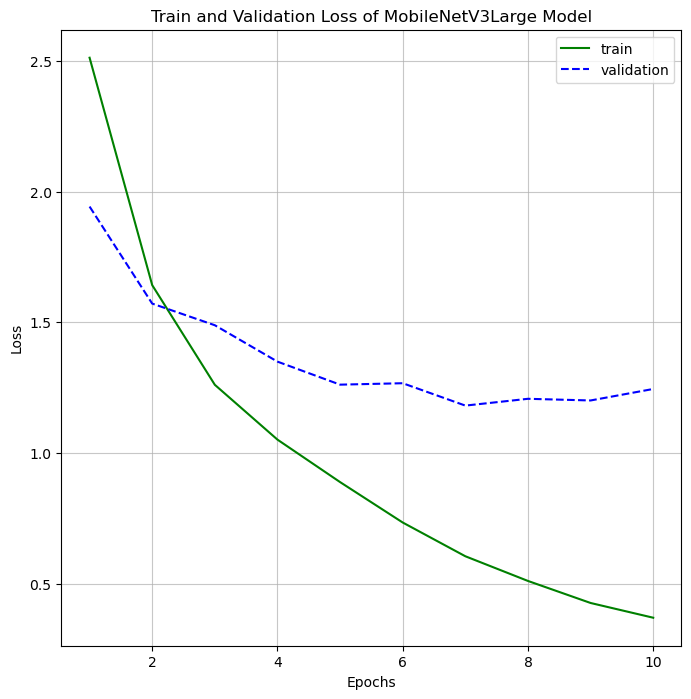

In [167]:
plot_loss(epoch_mobilenetv3, result_mobilenetv3.history, 'MobileNetV3Large')

### 2.1.5. EfficientNetV2 Large

In [200]:
# Specify image size and batch size
img_height_eff, img_width_eff = (224, 224)
batch_size = 32

In [201]:
train_batches_eff = ImageDataGenerator(preprocessing_function=
                                       tf.keras.applications.efficientnet_v2.preprocess_input) \
                    .flow_from_directory(training_data_dir, target_size=(img_height_eff, img_width_eff),
                                         batch_size=batch_size, class_mode='categorical', 
                                         shuffle=True)

Found 3024 images belonging to 21 classes.


In [202]:
validate_batches_eff = ImageDataGenerator(preprocessing_function=
                                       tf.keras.applications.efficientnet_v2.preprocess_input) \
                    .flow_from_directory(validate_data_dir, target_size=(img_height_eff, img_width_eff),
                                         batch_size=batch_size, class_mode='categorical', 
                                         shuffle=True)

Found 756 images belonging to 21 classes.


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

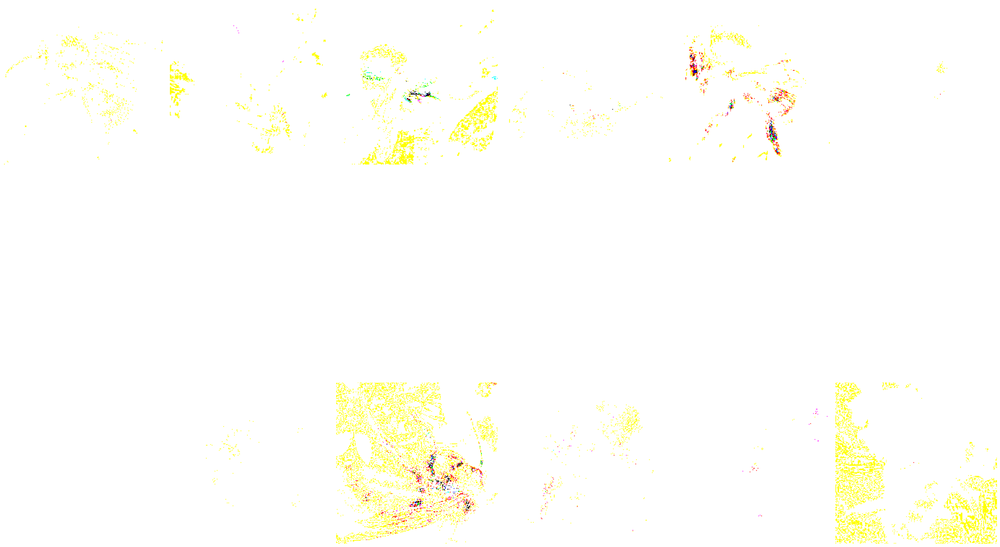

[[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
 [1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
 [0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0.

In [203]:
imgs, labels = next(train_batches_eff)

plotImages(imgs)
print(labels)

In [204]:
efficientnetv2 = tf.keras.applications.EfficientNetV2L(
    include_top=False,
    input_shape=(480, 480, 3),
    pooling='avg',
    weights='imagenet')

for layer in efficientnetv2.layers:
        layer.trainable=False

In [205]:
efficientnetv2.summary()

Model: "efficientnetv2-l"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_17 (InputLayer)       [(None, 480, 480, 3)]        0         []                            
                                                                                                  
 rescaling_7 (Rescaling)     (None, 480, 480, 3)          0         ['input_17[0][0]']            
                                                                                                  
 stem_conv (Conv2D)          (None, 240, 240, 32)         864       ['rescaling_7[0][0]']         
                                                                                                  
 stem_bn (BatchNormalizatio  (None, 240, 240, 32)         128       ['stem_conv[0][0]']           
 n)                                                                                

 2D)                                                                [0]']                         
                                                                                                  
 block2a_project_bn (BatchN  (None, 120, 120, 64)         256       ['block2a_project_conv[0][0]']
 ormalization)                                                                                    
                                                                                                  
 block2b_expand_conv (Conv2  (None, 120, 120, 256)        147456    ['block2a_project_bn[0][0]']  
 D)                                                                                               
                                                                                                  
 block2b_expand_bn (BatchNo  (None, 120, 120, 256)        1024      ['block2b_expand_conv[0][0]'] 
 rmalization)                                                                                     
          

                                                                     'block2d_add[0][0]']         
                                                                                                  
 block2f_expand_conv (Conv2  (None, 120, 120, 256)        147456    ['block2e_add[0][0]']         
 D)                                                                                               
                                                                                                  
 block2f_expand_bn (BatchNo  (None, 120, 120, 256)        1024      ['block2f_expand_conv[0][0]'] 
 rmalization)                                                                                     
                                                                                                  
 block2f_expand_activation   (None, 120, 120, 256)        0         ['block2f_expand_bn[0][0]']   
 (Activation)                                                                                     
          

 block3c_expand_activation   (None, 60, 60, 384)          0         ['block3c_expand_bn[0][0]']   
 (Activation)                                                                                     
                                                                                                  
 block3c_project_conv (Conv  (None, 60, 60, 96)           36864     ['block3c_expand_activation[0]
 2D)                                                                [0]']                         
                                                                                                  
 block3c_project_bn (BatchN  (None, 60, 60, 96)           384       ['block3c_project_conv[0][0]']
 ormalization)                                                                                    
                                                                                                  
 block3c_drop (Dropout)      (None, 60, 60, 96)           0         ['block3c_project_bn[0][0]']  
          

 block3g_project_conv (Conv  (None, 60, 60, 96)           36864     ['block3g_expand_activation[0]
 2D)                                                                [0]']                         
                                                                                                  
 block3g_project_bn (BatchN  (None, 60, 60, 96)           384       ['block3g_project_conv[0][0]']
 ormalization)                                                                                    
                                                                                                  
 block3g_drop (Dropout)      (None, 60, 60, 96)           0         ['block3g_project_bn[0][0]']  
                                                                                                  
 block3g_add (Add)           (None, 60, 60, 96)           0         ['block3g_drop[0][0]',        
                                                                     'block3f_add[0][0]']         
          

 ormalization)                                                                                    
                                                                                                  
 block4b_drop (Dropout)      (None, 30, 30, 192)          0         ['block4b_project_bn[0][0]']  
                                                                                                  
 block4b_add (Add)           (None, 30, 30, 192)          0         ['block4b_drop[0][0]',        
                                                                     'block4a_project_bn[0][0]']  
                                                                                                  
 block4c_expand_conv (Conv2  (None, 30, 30, 768)          147456    ['block4b_add[0][0]']         
 D)                                                                                               
                                                                                                  
 block4c_e

 block4d_project_bn (BatchN  (None, 30, 30, 192)          768       ['block4d_project_conv[0][0]']
 ormalization)                                                                                    
                                                                                                  
 block4d_drop (Dropout)      (None, 30, 30, 192)          0         ['block4d_project_bn[0][0]']  
                                                                                                  
 block4d_add (Add)           (None, 30, 30, 192)          0         ['block4d_drop[0][0]',        
                                                                     'block4c_add[0][0]']         
                                                                                                  
 block4e_expand_conv (Conv2  (None, 30, 30, 768)          147456    ['block4d_add[0][0]']         
 D)                                                                                               
          

                                                                                                  
 block4f_project_bn (BatchN  (None, 30, 30, 192)          768       ['block4f_project_conv[0][0]']
 ormalization)                                                                                    
                                                                                                  
 block4f_drop (Dropout)      (None, 30, 30, 192)          0         ['block4f_project_bn[0][0]']  
                                                                                                  
 block4f_add (Add)           (None, 30, 30, 192)          0         ['block4f_drop[0][0]',        
                                                                     'block4e_add[0][0]']         
                                                                                                  
 block4g_expand_conv (Conv2  (None, 30, 30, 768)          147456    ['block4f_add[0][0]']         
 D)       

 2D)                                                                                              
                                                                                                  
 block4h_project_bn (BatchN  (None, 30, 30, 192)          768       ['block4h_project_conv[0][0]']
 ormalization)                                                                                    
                                                                                                  
 block4h_drop (Dropout)      (None, 30, 30, 192)          0         ['block4h_project_bn[0][0]']  
                                                                                                  
 block4h_add (Add)           (None, 30, 30, 192)          0         ['block4h_drop[0][0]',        
                                                                     'block4g_add[0][0]']         
                                                                                                  
 block4i_e

 block4j_project_conv (Conv  (None, 30, 30, 192)          147456    ['block4j_se_excite[0][0]']   
 2D)                                                                                              
                                                                                                  
 block4j_project_bn (BatchN  (None, 30, 30, 192)          768       ['block4j_project_conv[0][0]']
 ormalization)                                                                                    
                                                                                                  
 block4j_drop (Dropout)      (None, 30, 30, 192)          0         ['block4j_project_bn[0][0]']  
                                                                                                  
 block4j_add (Add)           (None, 30, 30, 192)          0         ['block4j_drop[0][0]',        
                                                                     'block4i_add[0][0]']         
          

 ormalization)                                                                                    
                                                                                                  
 block5b_drop (Dropout)      (None, 30, 30, 224)          0         ['block5b_project_bn[0][0]']  
                                                                                                  
 block5b_add (Add)           (None, 30, 30, 224)          0         ['block5b_drop[0][0]',        
                                                                     'block5a_project_bn[0][0]']  
                                                                                                  
 block5c_expand_conv (Conv2  (None, 30, 30, 1344)         301056    ['block5b_add[0][0]']         
 D)                                                                                               
                                                                                                  
 block5c_e

 block5d_project_bn (BatchN  (None, 30, 30, 224)          896       ['block5d_project_conv[0][0]']
 ormalization)                                                                                    
                                                                                                  
 block5d_drop (Dropout)      (None, 30, 30, 224)          0         ['block5d_project_bn[0][0]']  
                                                                                                  
 block5d_add (Add)           (None, 30, 30, 224)          0         ['block5d_drop[0][0]',        
                                                                     'block5c_add[0][0]']         
                                                                                                  
 block5e_expand_conv (Conv2  (None, 30, 30, 1344)         301056    ['block5d_add[0][0]']         
 D)                                                                                               
          

                                                                                                  
 block5f_project_bn (BatchN  (None, 30, 30, 224)          896       ['block5f_project_conv[0][0]']
 ormalization)                                                                                    
                                                                                                  
 block5f_drop (Dropout)      (None, 30, 30, 224)          0         ['block5f_project_bn[0][0]']  
                                                                                                  
 block5f_add (Add)           (None, 30, 30, 224)          0         ['block5f_drop[0][0]',        
                                                                     'block5e_add[0][0]']         
                                                                                                  
 block5g_expand_conv (Conv2  (None, 30, 30, 1344)         301056    ['block5f_add[0][0]']         
 D)       

 2D)                                                                                              
                                                                                                  
 block5h_project_bn (BatchN  (None, 30, 30, 224)          896       ['block5h_project_conv[0][0]']
 ormalization)                                                                                    
                                                                                                  
 block5h_drop (Dropout)      (None, 30, 30, 224)          0         ['block5h_project_bn[0][0]']  
                                                                                                  
 block5h_add (Add)           (None, 30, 30, 224)          0         ['block5h_drop[0][0]',        
                                                                     'block5g_add[0][0]']         
                                                                                                  
 block5i_e

 block5j_project_conv (Conv  (None, 30, 30, 224)          301056    ['block5j_se_excite[0][0]']   
 2D)                                                                                              
                                                                                                  
 block5j_project_bn (BatchN  (None, 30, 30, 224)          896       ['block5j_project_conv[0][0]']
 ormalization)                                                                                    
                                                                                                  
 block5j_drop (Dropout)      (None, 30, 30, 224)          0         ['block5j_project_bn[0][0]']  
                                                                                                  
 block5j_add (Add)           (None, 30, 30, 224)          0         ['block5j_drop[0][0]',        
                                                                     'block5i_add[0][0]']         
          

                                                                                                  
 block5l_project_conv (Conv  (None, 30, 30, 224)          301056    ['block5l_se_excite[0][0]']   
 2D)                                                                                              
                                                                                                  
 block5l_project_bn (BatchN  (None, 30, 30, 224)          896       ['block5l_project_conv[0][0]']
 ormalization)                                                                                    
                                                                                                  
 block5l_drop (Dropout)      (None, 30, 30, 224)          0         ['block5l_project_bn[0][0]']  
                                                                                                  
 block5l_add (Add)           (None, 30, 30, 224)          0         ['block5l_drop[0][0]',        
          

 y)                                                                  'block5n_se_expand[0][0]']   
                                                                                                  
 block5n_project_conv (Conv  (None, 30, 30, 224)          301056    ['block5n_se_excite[0][0]']   
 2D)                                                                                              
                                                                                                  
 block5n_project_bn (BatchN  (None, 30, 30, 224)          896       ['block5n_project_conv[0][0]']
 ormalization)                                                                                    
                                                                                                  
 block5n_drop (Dropout)      (None, 30, 30, 224)          0         ['block5n_project_bn[0][0]']  
                                                                                                  
 block5n_a

 block5p_se_excite (Multipl  (None, 30, 30, 1344)         0         ['block5p_activation[0][0]',  
 y)                                                                  'block5p_se_expand[0][0]']   
                                                                                                  
 block5p_project_conv (Conv  (None, 30, 30, 224)          301056    ['block5p_se_excite[0][0]']   
 2D)                                                                                              
                                                                                                  
 block5p_project_bn (BatchN  (None, 30, 30, 224)          896       ['block5p_project_conv[0][0]']
 ormalization)                                                                                    
                                                                                                  
 block5p_drop (Dropout)      (None, 30, 30, 224)          0         ['block5p_project_bn[0][0]']  
          

                                                                                                  
 block5r_se_excite (Multipl  (None, 30, 30, 1344)         0         ['block5r_activation[0][0]',  
 y)                                                                  'block5r_se_expand[0][0]']   
                                                                                                  
 block5r_project_conv (Conv  (None, 30, 30, 224)          301056    ['block5r_se_excite[0][0]']   
 2D)                                                                                              
                                                                                                  
 block5r_project_bn (BatchN  (None, 30, 30, 224)          896       ['block5r_project_conv[0][0]']
 ormalization)                                                                                    
                                                                                                  
 block5r_d

 block6a_se_expand (Conv2D)  (None, 1, 1, 1344)           76608     ['block6a_se_reduce[0][0]']   
                                                                                                  
 block6a_se_excite (Multipl  (None, 15, 15, 1344)         0         ['block6a_activation[0][0]',  
 y)                                                                  'block6a_se_expand[0][0]']   
                                                                                                  
 block6a_project_conv (Conv  (None, 15, 15, 384)          516096    ['block6a_se_excite[0][0]']   
 2D)                                                                                              
                                                                                                  
 block6a_project_bn (BatchN  (None, 15, 15, 384)          1536      ['block6a_project_conv[0][0]']
 ormalization)                                                                                    
          

                                                                                                  
 block6c_project_conv (Conv  (None, 15, 15, 384)          884736    ['block6c_se_excite[0][0]']   
 2D)                                                                                              
                                                                                                  
 block6c_project_bn (BatchN  (None, 15, 15, 384)          1536      ['block6c_project_conv[0][0]']
 ormalization)                                                                                    
                                                                                                  
 block6c_drop (Dropout)      (None, 15, 15, 384)          0         ['block6c_project_bn[0][0]']  
                                                                                                  
 block6c_add (Add)           (None, 15, 15, 384)          0         ['block6c_drop[0][0]',        
          

 y)                                                                  'block6e_se_expand[0][0]']   
                                                                                                  
 block6e_project_conv (Conv  (None, 15, 15, 384)          884736    ['block6e_se_excite[0][0]']   
 2D)                                                                                              
                                                                                                  
 block6e_project_bn (BatchN  (None, 15, 15, 384)          1536      ['block6e_project_conv[0][0]']
 ormalization)                                                                                    
                                                                                                  
 block6e_drop (Dropout)      (None, 15, 15, 384)          0         ['block6e_project_bn[0][0]']  
                                                                                                  
 block6e_a

 block6g_se_excite (Multipl  (None, 15, 15, 2304)         0         ['block6g_activation[0][0]',  
 y)                                                                  'block6g_se_expand[0][0]']   
                                                                                                  
 block6g_project_conv (Conv  (None, 15, 15, 384)          884736    ['block6g_se_excite[0][0]']   
 2D)                                                                                              
                                                                                                  
 block6g_project_bn (BatchN  (None, 15, 15, 384)          1536      ['block6g_project_conv[0][0]']
 ormalization)                                                                                    
                                                                                                  
 block6g_drop (Dropout)      (None, 15, 15, 384)          0         ['block6g_project_bn[0][0]']  
          

                                                                                                  
 block6i_se_excite (Multipl  (None, 15, 15, 2304)         0         ['block6i_activation[0][0]',  
 y)                                                                  'block6i_se_expand[0][0]']   
                                                                                                  
 block6i_project_conv (Conv  (None, 15, 15, 384)          884736    ['block6i_se_excite[0][0]']   
 2D)                                                                                              
                                                                                                  
 block6i_project_bn (BatchN  (None, 15, 15, 384)          1536      ['block6i_project_conv[0][0]']
 ormalization)                                                                                    
                                                                                                  
 block6i_d

 block6k_se_expand (Conv2D)  (None, 1, 1, 2304)           223488    ['block6k_se_reduce[0][0]']   
                                                                                                  
 block6k_se_excite (Multipl  (None, 15, 15, 2304)         0         ['block6k_activation[0][0]',  
 y)                                                                  'block6k_se_expand[0][0]']   
                                                                                                  
 block6k_project_conv (Conv  (None, 15, 15, 384)          884736    ['block6k_se_excite[0][0]']   
 2D)                                                                                              
                                                                                                  
 block6k_project_bn (BatchN  (None, 15, 15, 384)          1536      ['block6k_project_conv[0][0]']
 ormalization)                                                                                    
          

                                                                                                  
 block6m_se_expand (Conv2D)  (None, 1, 1, 2304)           223488    ['block6m_se_reduce[0][0]']   
                                                                                                  
 block6m_se_excite (Multipl  (None, 15, 15, 2304)         0         ['block6m_activation[0][0]',  
 y)                                                                  'block6m_se_expand[0][0]']   
                                                                                                  
 block6m_project_conv (Conv  (None, 15, 15, 384)          884736    ['block6m_se_excite[0][0]']   
 2D)                                                                                              
                                                                                                  
 block6m_project_bn (BatchN  (None, 15, 15, 384)          1536      ['block6m_project_conv[0][0]']
 ormalizat

 block6o_se_reduce (Conv2D)  (None, 1, 1, 96)             221280    ['block6o_se_reshape[0][0]']  
                                                                                                  
 block6o_se_expand (Conv2D)  (None, 1, 1, 2304)           223488    ['block6o_se_reduce[0][0]']   
                                                                                                  
 block6o_se_excite (Multipl  (None, 15, 15, 2304)         0         ['block6o_activation[0][0]',  
 y)                                                                  'block6o_se_expand[0][0]']   
                                                                                                  
 block6o_project_conv (Conv  (None, 15, 15, 384)          884736    ['block6o_se_excite[0][0]']   
 2D)                                                                                              
                                                                                                  
 block6o_p

                                                                                                  
 block6q_se_reduce (Conv2D)  (None, 1, 1, 96)             221280    ['block6q_se_reshape[0][0]']  
                                                                                                  
 block6q_se_expand (Conv2D)  (None, 1, 1, 2304)           223488    ['block6q_se_reduce[0][0]']   
                                                                                                  
 block6q_se_excite (Multipl  (None, 15, 15, 2304)         0         ['block6q_activation[0][0]',  
 y)                                                                  'block6q_se_expand[0][0]']   
                                                                                                  
 block6q_project_conv (Conv  (None, 15, 15, 384)          884736    ['block6q_se_excite[0][0]']   
 2D)                                                                                              
          

 e)                                                                                               
                                                                                                  
 block6s_se_reduce (Conv2D)  (None, 1, 1, 96)             221280    ['block6s_se_reshape[0][0]']  
                                                                                                  
 block6s_se_expand (Conv2D)  (None, 1, 1, 2304)           223488    ['block6s_se_reduce[0][0]']   
                                                                                                  
 block6s_se_excite (Multipl  (None, 15, 15, 2304)         0         ['block6s_activation[0][0]',  
 y)                                                                  'block6s_se_expand[0][0]']   
                                                                                                  
 block6s_project_conv (Conv  (None, 15, 15, 384)          884736    ['block6s_se_excite[0][0]']   
 2D)      

 block6u_se_reshape (Reshap  (None, 1, 1, 2304)           0         ['block6u_se_squeeze[0][0]']  
 e)                                                                                               
                                                                                                  
 block6u_se_reduce (Conv2D)  (None, 1, 1, 96)             221280    ['block6u_se_reshape[0][0]']  
                                                                                                  
 block6u_se_expand (Conv2D)  (None, 1, 1, 2304)           223488    ['block6u_se_reduce[0][0]']   
                                                                                                  
 block6u_se_excite (Multipl  (None, 15, 15, 2304)         0         ['block6u_activation[0][0]',  
 y)                                                                  'block6u_se_expand[0][0]']   
                                                                                                  
 block6u_p

                                                                                                  
 block6w_se_reshape (Reshap  (None, 1, 1, 2304)           0         ['block6w_se_squeeze[0][0]']  
 e)                                                                                               
                                                                                                  
 block6w_se_reduce (Conv2D)  (None, 1, 1, 96)             221280    ['block6w_se_reshape[0][0]']  
                                                                                                  
 block6w_se_expand (Conv2D)  (None, 1, 1, 2304)           223488    ['block6w_se_reduce[0][0]']   
                                                                                                  
 block6w_se_excite (Multipl  (None, 15, 15, 2304)         0         ['block6w_activation[0][0]',  
 y)                                                                  'block6w_se_expand[0][0]']   
          

 AveragePooling2D)                                                                                
                                                                                                  
 block6y_se_reshape (Reshap  (None, 1, 1, 2304)           0         ['block6y_se_squeeze[0][0]']  
 e)                                                                                               
                                                                                                  
 block6y_se_reduce (Conv2D)  (None, 1, 1, 96)             221280    ['block6y_se_reshape[0][0]']  
                                                                                                  
 block6y_se_expand (Conv2D)  (None, 1, 1, 2304)           223488    ['block6y_se_reduce[0][0]']   
                                                                                                  
 block6y_se_excite (Multipl  (None, 15, 15, 2304)         0         ['block6y_activation[0][0]',  
 y)       

                                                                                                  
 block7b_se_reduce (Conv2D)  (None, 1, 1, 160)            614560    ['block7b_se_reshape[0][0]']  
                                                                                                  
 block7b_se_expand (Conv2D)  (None, 1, 1, 3840)           618240    ['block7b_se_reduce[0][0]']   
                                                                                                  
 block7b_se_excite (Multipl  (None, 15, 15, 3840)         0         ['block7b_activation[0][0]',  
 y)                                                                  'block7b_se_expand[0][0]']   
                                                                                                  
 block7b_project_conv (Conv  (None, 15, 15, 640)          2457600   ['block7b_se_excite[0][0]']   
 2D)                                                                                              
          

 e)                                                                                               
                                                                                                  
 block7d_se_reduce (Conv2D)  (None, 1, 1, 160)            614560    ['block7d_se_reshape[0][0]']  
                                                                                                  
 block7d_se_expand (Conv2D)  (None, 1, 1, 3840)           618240    ['block7d_se_reduce[0][0]']   
                                                                                                  
 block7d_se_excite (Multipl  (None, 15, 15, 3840)         0         ['block7d_activation[0][0]',  
 y)                                                                  'block7d_se_expand[0][0]']   
                                                                                                  
 block7d_project_conv (Conv  (None, 15, 15, 640)          2457600   ['block7d_se_excite[0][0]']   
 2D)      

 block7f_se_reshape (Reshap  (None, 1, 1, 3840)           0         ['block7f_se_squeeze[0][0]']  
 e)                                                                                               
                                                                                                  
 block7f_se_reduce (Conv2D)  (None, 1, 1, 160)            614560    ['block7f_se_reshape[0][0]']  
                                                                                                  
 block7f_se_expand (Conv2D)  (None, 1, 1, 3840)           618240    ['block7f_se_reduce[0][0]']   
                                                                                                  
 block7f_se_excite (Multipl  (None, 15, 15, 3840)         0         ['block7f_activation[0][0]',  
 y)                                                                  'block7f_se_expand[0][0]']   
                                                                                                  
 block7f_p

In [206]:
model_efficientnetv2 = Sequential()

model_efficientnetv2.add(efficientnetv2)
model_efficientnetv2.add(Flatten())
model_efficientnetv2.add(Dense(512, activation='relu'))
model_efficientnetv2.add(Dropout(0.2))
model_efficientnetv2.add(Dense(21, activation='softmax'))

In [207]:
model_efficientnetv2.summary()

Model: "sequential_13"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 efficientnetv2-l (Function  (None, 1280)              117746848 
 al)                                                             
                                                                 
 flatten_13 (Flatten)        (None, 1280)              0         
                                                                 
 dense_26 (Dense)            (None, 512)               655872    
                                                                 
 dropout_13 (Dropout)        (None, 512)               0         
                                                                 
 dense_27 (Dense)            (None, 21)                10773     
                                                                 
Total params: 118413493 (451.71 MB)
Trainable params: 666645 (2.54 MB)
Non-trainable params: 117746848 (449.17 MB)
____

In [208]:
model_efficientnetv2.compile(optimizer=Adam(learning_rate=0.001),
                             loss='categorical_crossentropy',
                             metrics=['accuracy'])

In [209]:
epoch_efficientnetv2 = 5

result_efficientnetv2 = model_efficientnetv2.fit(train_batches_eff,
                                                 validation_data=validate_batches_eff,
                                                 epochs=epoch_efficientnetv2,
                                                 verbose=2)

Epoch 1/5
95/95 - 228s - loss: 3.0267 - accuracy: 0.0764 - val_loss: 2.9383 - val_accuracy: 0.1283 - 228s/epoch - 2s/step
Epoch 2/5
95/95 - 210s - loss: 2.8491 - accuracy: 0.1399 - val_loss: 2.7815 - val_accuracy: 0.1799 - 210s/epoch - 2s/step
Epoch 3/5
95/95 - 212s - loss: 2.6625 - accuracy: 0.2100 - val_loss: 2.6365 - val_accuracy: 0.2434 - 212s/epoch - 2s/step
Epoch 4/5
95/95 - 215s - loss: 2.4708 - accuracy: 0.2688 - val_loss: 2.4079 - val_accuracy: 0.2963 - 215s/epoch - 2s/step
Epoch 5/5
95/95 - 221s - loss: 2.2806 - accuracy: 0.3142 - val_loss: 2.2460 - val_accuracy: 0.3320 - 221s/epoch - 2s/step


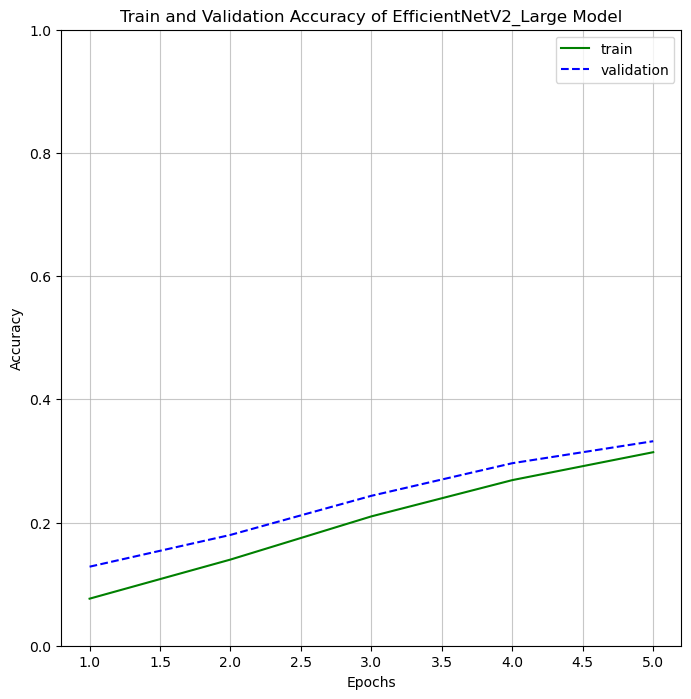

In [210]:
plot_accuracy(epoch_efficientnetv2, result_efficientnetv2.history, 'EfficientNetV2_Large')

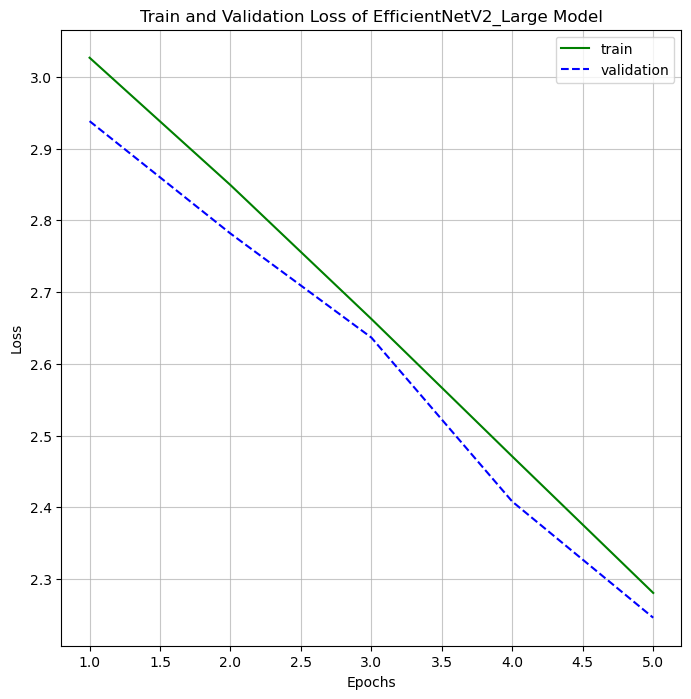

In [211]:
plot_loss(epoch_efficientnetv2, result_efficientnetv2.history, 'EfficientNetV2_Large')

### Some insights after augmentation

In [54]:
train_batches_incep_aug = ImageDataGenerator(
    preprocessing_function=tf.keras.applications.inception_v3.preprocess_input,
    rotation_range=20,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True
) \
    .flow_from_directory(
    training_data_dir,
    target_size=(img_height_incep, img_width_incep),
    batch_size=batch_size,
    class_mode='categorical',
    shuffle=True
)

Found 3024 images belonging to 21 classes.


In [55]:
print(len(train_batches_incep))
print(train_batches_incep.n)

95
3024


In [56]:
print(len(train_batches_incep_aug))
print(train_batches_incep_aug.n)

95
3024


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

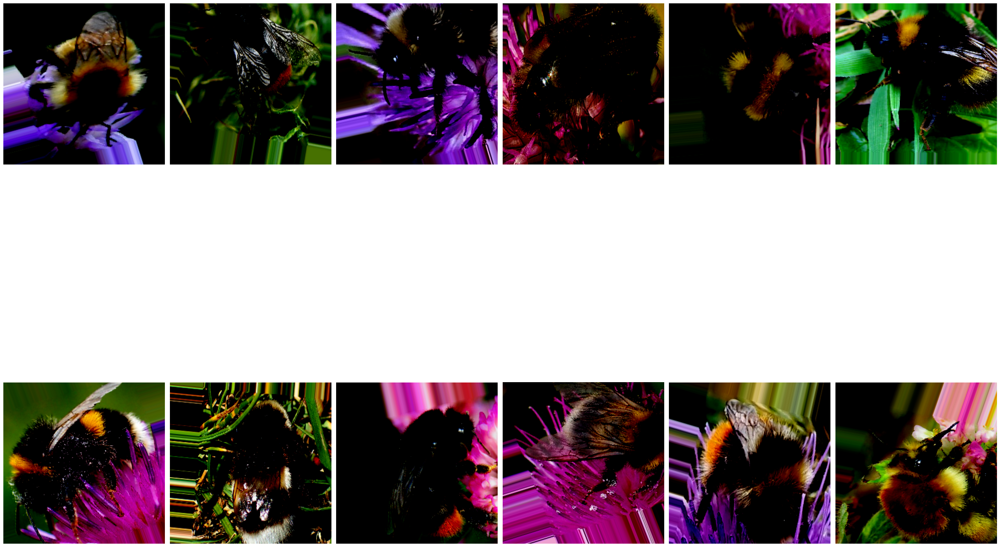

[[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
 [0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
 [0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0.

In [57]:
imgs, labels = next(train_batches_incep_aug)

plotImages(imgs)
print(labels)

In [63]:
epoch_inceptionv3 = 5

result_inceptionv3 = model_inceptionv3.fit(train_batches_incep_aug,
                                           validation_data=validate_batches_incep,
                                           epochs=epoch_inceptionv3,
                                           verbose=2)

Epoch 1/5
95/95 - 72s - loss: 2.9940 - accuracy: 0.1091 - val_loss: 2.7677 - val_accuracy: 0.2011 - 72s/epoch - 756ms/step
Epoch 2/5
95/95 - 68s - loss: 2.6480 - accuracy: 0.1951 - val_loss: 2.5447 - val_accuracy: 0.1958 - 68s/epoch - 719ms/step
Epoch 3/5
95/95 - 69s - loss: 2.4119 - accuracy: 0.2579 - val_loss: 2.3883 - val_accuracy: 0.2725 - 69s/epoch - 725ms/step
Epoch 4/5
95/95 - 69s - loss: 2.2757 - accuracy: 0.3059 - val_loss: 2.2909 - val_accuracy: 0.2817 - 69s/epoch - 730ms/step
Epoch 5/5
95/95 - 69s - loss: 2.1568 - accuracy: 0.3307 - val_loss: 2.2298 - val_accuracy: 0.2976 - 69s/epoch - 731ms/step


In [78]:
from tensorflow.keras.utils import Sequence

class ConcatenateGenerators(Sequence):
    def __init__(self, generator1, generator2):
        self.generator1 = generator1
        self.generator2 = generator2
        self.batch_size = generator1.batch_size  # Assuming both generators have the same batch size
        self.n = len(generator1) * self.batch_size + len(generator2) * self.batch_size

    def __len__(self):
        return self.n // self.batch_size

    def __getitem__(self, index):
        if index < len(self.generator1) * self.batch_size:
            return self.generator1[index % len(self.generator1)]
        else:
            return self.generator2[index % len(self.generator2)]

# Usage example
train_batches_incep_combined = ConcatenateGenerators(train_batches_incep, train_batches_incep_aug)

In [79]:
print(len(train_batches_incep_combined))

190


In [80]:
print(train_batches_incep_combined.n)

6080


In [81]:
epoch_inceptionv3 = 5

result_inceptionv3 = model_inceptionv3.fit(train_batches_incep_combined,
                                           validation_data=validate_batches_incep,
                                           epochs=epoch_inceptionv3,
                                           verbose=2)

Epoch 1/5
190/190 - 109s - loss: 1.3129 - accuracy: 0.5904 - val_loss: 1.8681 - val_accuracy: 0.4114 - 109s/epoch - 576ms/step
Epoch 2/5
190/190 - 109s - loss: 1.1703 - accuracy: 0.6348 - val_loss: 1.7585 - val_accuracy: 0.4484 - 109s/epoch - 574ms/step
Epoch 3/5
190/190 - 110s - loss: 1.0566 - accuracy: 0.6682 - val_loss: 1.7502 - val_accuracy: 0.4444 - 110s/epoch - 578ms/step
Epoch 4/5
190/190 - 4145s - loss: 0.9666 - accuracy: 0.6946 - val_loss: 1.7120 - val_accuracy: 0.4563 - 4145s/epoch - 22s/step
Epoch 5/5
190/190 - 107s - loss: 0.9034 - accuracy: 0.7189 - val_loss: 1.8155 - val_accuracy: 0.4378 - 107s/epoch - 561ms/step


<br> </br>
## 2.2 Deep learning using pytorch
<br> </br>

In [2]:
# Import libraries
import pandas as pd

from __future__ import print_function 
from __future__ import division
import torch
import torch.nn as nn
import torch.optim as optim
from torch.optim import lr_scheduler

import torchvision
from torchvision import datasets, models, transforms
from torch.utils import data

import time
import copy

In [3]:
print("PyTorch Version: ",torch.__version__)
print("Torchvision Version: ",torchvision.__version__)

PyTorch Version:  2.1.0
Torchvision Version:  0.16.0


In [4]:
# Check again where the data locates
print(training_data_dir)
print(validate_data_dir)

NameError: name 'training_data_dir' is not defined

<br> </br>
- <h1 style="font-size: 16px"> Create functions for building and training pre-trained models in Pytorch. </h1>
<br> </br>

In [579]:
def set_parameter_requires_grad(model, feature_extracting):
    if feature_extracting:
        for param in model.parameters():
            param.requires_grad = False

In [1]:
def initialize_model(model_name, num_classes, feature_extract):
    # Initialize these variables which will be set in this if statement. Each of these
    #   variables is model specific.
    model_ft = None
    input_size = 0

    if model_name == "squeezenet":
        """ Squeezenet
        """
        model_ft = models.squeezenet1_1(weights='DEFAULT')
        set_parameter_requires_grad(model_ft, feature_extract)
        model_ft.classifier[1] = nn.Conv2d(512, num_classes, kernel_size=(1,1), stride=(1,1))
        model_ft.num_classes = num_classes
        input_size = 224
    
    elif model_name == "densenet":
        """ Densenet121
        """
        model_ft = models.densenet121(weights='DEFAULT')
        set_parameter_requires_grad(model_ft, feature_extract)
        num_ftrs = model_ft.classifier.in_features
        model_ft.classifier = nn.Linear(num_ftrs, num_classes)
        input_size = 224


    elif model_name == "mnasnet":
        """ MNASNET1_0
        """
        model_ft = models.wide_resnet101_2(weights='DEFAULT')
        set_parameter_requires_grad(model_ft, feature_extract)
        num_ftrs = model_ft.classifier[1].in_features
        model_ft.classifier[1] = nn.Linear(num_ftrs, num_classes)
        model_ft.num_classes = num_classes
        input_size = 224

    elif model_name == "shufflenet":
        """ ShuffleNetV2
        """
        model_ft = models.shufflenet_v2_x2_0(weights='DEFAULT')
        set_parameter_requires_grad(model_ft, feature_extract)
        num_ftrs = model_ft.fc.in_features
        model_ft.fc = nn.Linear(num_ftrs, num_classes)
        input_size = 224

    elif model_name == "googlenet":
        """ GoogleNet
        """
        model_ft = models.googlenet(weights='DEFAULT')
        set_parameter_requires_grad(model_ft, feature_extract)
        num_ftrs = model_ft.fc.in_features
        model_ft.fc = nn.Linear(num_ftrs, num_classes) 
        input_size = 224



    else:
        print("Invalid model name, exiting...")
        exit()
    
    return model_ft, input_size

In [581]:
# Number of classes
num_classes = len(os.listdir(training_data_dir))
print(num_classes)

# Batch size for training
batch_size = 32

21


In [582]:
# Applying Transforms to the Data
data_transform = { 
    'train': transforms.Compose([
        transforms.RandomResizedCrop(input_size),
        #transforms.RandomRotation(degrees=15),
        #transforms.RandomHorizontalFlip(),
        #transforms.CenterCrop(input_size),
        transforms.ToTensor(),
        transforms.Normalize([0.485, 0.456, 0.406],
                             [0.229, 0.224, 0.225])
    ]),
    'validate': transforms.Compose([
        transforms.Resize(input_size),
        transforms.CenterCrop(input_size),
        transforms.ToTensor(),
        transforms.Normalize([0.485, 0.456, 0.406],
                             [0.229, 0.224, 0.225])
    ])
}

In [583]:
# 'test': transforms.Compose([
#         transforms.Resize(input_size),
#         #transforms.CenterCrop(input_size),
#         transforms.ToTensor(),
#         transforms.Normalize([0.485, 0.456, 0.406],
#                              [0.229, 0.224, 0.225])
#     ])

In [584]:
# Load Data from folders
image_datasets = {
    'train': datasets.ImageFolder(root=training_data_dir, transform=data_transform['train']),
    'validate': datasets.ImageFolder(root=validate_data_dir, transform=data_transform['validate'])
}

# Get a mapping of the indices to the class names, in order to see the output classes of the test images.
idx_to_class = {v: k for k, v in image_datasets['train'].class_to_idx.items()}
print(idx_to_class)

{0: 'bombus barbutellus', 1: 'bombus bohemicus', 2: 'bombus campestris', 3: 'bombus cryptarum', 4: 'bombus distinguendus', 5: 'bombus hortorum', 6: 'bombus hypnorum', 7: 'bombus jonellus', 8: 'bombus lapidarius', 9: 'bombus lucorum', 10: 'bombus magnus', 11: 'bombus monticola', 12: 'bombus muscorum', 13: 'bombus pascuorum', 14: 'bombus pratorum', 15: 'bombus ruderarius', 16: 'bombus rupestris', 17: 'bombus sylvarum', 18: 'bombus sylvestris', 19: 'bombus terrestris', 20: 'bombus vestalis'}


In [585]:
# Size of train and validate data
train_data_size = len(image_datasets['train'])
validate_data_size = len(image_datasets['validate'])

print(train_data_size, validate_data_size)

3024 756


In [586]:
# Load train and validate data and put them into a dictionary
dataloaders_dict = {x: torch.utils.data.DataLoader(image_datasets[x], 
                    batch_size=batch_size, shuffle=True, num_workers=4) for x in ['train', 'validate']}

In [587]:
# Detect if GPU is available
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
device

device(type='cpu')

### 2.2.1 SqueezeNet

In [588]:
# Number of epochs for training
num_epochs = 5

# Flag for feature extracting. When False, we finetune the whole model, 
# When True we only update the reshaped layer params
feature_extract = True


# Models to choose from: ['squeezenet', 'wideresnet', 'densenet', 'shufflenet', 'googlenet']
model_name = "squeezenet"

In [589]:
# Initialize the model
model_ft, input_size = initialize_model(model_name, num_classes, feature_extract)

# Print the model instantiated
print(model_ft)

SqueezeNet(
  (features): Sequential(
    (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(2, 2))
    (1): ReLU(inplace=True)
    (2): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=True)
    (3): Fire(
      (squeeze): Conv2d(64, 16, kernel_size=(1, 1), stride=(1, 1))
      (squeeze_activation): ReLU(inplace=True)
      (expand1x1): Conv2d(16, 64, kernel_size=(1, 1), stride=(1, 1))
      (expand1x1_activation): ReLU(inplace=True)
      (expand3x3): Conv2d(16, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (expand3x3_activation): ReLU(inplace=True)
    )
    (4): Fire(
      (squeeze): Conv2d(128, 16, kernel_size=(1, 1), stride=(1, 1))
      (squeeze_activation): ReLU(inplace=True)
      (expand1x1): Conv2d(16, 64, kernel_size=(1, 1), stride=(1, 1))
      (expand1x1_activation): ReLU(inplace=True)
      (expand3x3): Conv2d(16, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (expand3x3_activation): ReLU(inplace=True)
    )
    (5): MaxPool2d

In [590]:
# Send the model to CPU
model_ft = model_ft.to(device)

# Gather the parameters to be optimized/updated in this run. If we are
#  finetuning we will be updating all parameters. However, if we are 
#  doing feature extract method, we will only update the parameters
#  that we have just initialized, i.e. the parameters with requires_grad
#  is True.
params_to_update = model_ft.parameters()
print("Params to learn:")
if feature_extract:
    params_to_update = []
    for name,param in model_ft.named_parameters():
        if param.requires_grad == True:
            params_to_update.append(param)
            print("\t",name)
else:
    for name,param in model_ft.named_parameters():
        if param.requires_grad == True:
            print("\t",name)

# Observe that all parameters are being optimized
optimizer_ft = optim.Adam(model_ft.parameters(), lr=0.001)

# ACTIVATION: add "scheduler" arg. to train_model 
exp_lr_scheduler = lr_scheduler.StepLR(optimizer_ft, step_size=7, gamma=0.1)

Params to learn:
	 classifier.1.weight
	 classifier.1.bias


In [591]:
# Setup the loss function
criterion = nn.CrossEntropyLoss()

In [614]:

def train_model(model, dataloaders, criterion, optimizer, scheduler, num_epochs=25, is_squeezenet=False):
    since = time.time()

    history = []

    best_model_wts = copy.deepcopy(model.state_dict())
    best_acc = 0.0

    device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
    model = model.to(device)

    for epoch in range(num_epochs):
        epoch_start = time.time()
        print("Epoch: {:03d}/{:03d}".format(epoch + 1, num_epochs))

        for phase in ['train', 'validate']:
            if phase == 'train':
                scheduler.step()
                model.train()
            else:
                model.eval()

            running_loss = 0.0
            running_corrects = 0

            for inputs, labels in dataloaders[phase]:
                inputs = inputs.to(device)
                labels = labels.to(device)

                optimizer.zero_grad()

                with torch.set_grad_enabled(phase == 'train'):
                    if is_squeezenet and phase == 'train':
                        outputs = model(inputs)
                        loss = criterion(outputs, labels)
                    else:
                        outputs = model(inputs)
                        loss = criterion(outputs, labels)

                        if not is_squeezenet and phase == 'train':
                            outputs, aux_outputs = outputs

                    _, preds = torch.max(outputs, 1)

                    if phase == 'train':
                        loss.backward()
                        optimizer.step()

                running_loss += loss.item() * inputs.size(0)
                running_corrects += torch.sum(preds == labels.data)

            epoch_loss = running_loss / len(dataloaders[phase].dataset)
            epoch_acc = running_corrects.double() / len(dataloaders[phase].dataset)

            print("{} Loss: {:.4f} Accuracy: {:.4f}%".format(phase.capitalize(), epoch_loss, epoch_acc * 100))

            # Save information in history
            if phase == 'train':
                train_loss = epoch_loss
                train_accuracy = epoch_acc.item()
            elif phase == 'validate':
                validate_loss = epoch_loss
                validate_accuracy = epoch_acc.item()
                
            if phase == 'validate' and epoch_acc > best_acc:
                best_acc = epoch_acc
                best_model_wts = copy.deepcopy(model.state_dict())
        
        history.append([train_loss, train_accuracy, validate_loss, validate_accuracy])
        
        epoch_end = time.time()
        print("Epoch duration: {:.4f}s".format(epoch_end - epoch_start))
        print()

    time_elapsed = time.time() - since
    print('Training complete in {:.0f}m {:.0f}s'.format(time_elapsed // 60, time_elapsed % 60))
    print('Best Validation Accuracy: {:.4f}%'.format(best_acc * 100))

    # Load best model weights
    model.load_state_dict(best_model_wts)

    return model, history

In [594]:
#torch.save(history, dataset+'_history.pt')

In [595]:
model_squeezenet, result_squeezenet = train_model(model_ft, dataloaders_dict, 
                                                  criterion, optimizer_ft, exp_lr_scheduler, 
                                                  num_epochs=num_epochs, is_squeezenet=(model_name=="squeezenet"))

Epoch: 001/005
Train Loss: 2.9841 Accuracy: 12.9299%
Validate Loss: 2.6554 Accuracy: 20.7672%
Epoch duration: 24.3789s

Epoch: 002/005
Train Loss: 2.5415 Accuracy: 23.2804%
Validate Loss: 2.3393 Accuracy: 28.9683%
Epoch duration: 23.8792s

Epoch: 003/005
Train Loss: 2.3056 Accuracy: 30.2579%
Validate Loss: 2.0487 Accuracy: 37.1693%
Epoch duration: 24.3965s

Epoch: 004/005
Train Loss: 2.1923 Accuracy: 33.2011%
Validate Loss: 1.9823 Accuracy: 39.8148%
Epoch duration: 25.5334s

Epoch: 005/005
Train Loss: 2.0782 Accuracy: 36.9709%
Validate Loss: 1.8864 Accuracy: 44.4444%
Epoch duration: 24.8750s

Training complete in 2m 3s
Best Validation Accuracy: 44.4444%


<br> </br>
- <h1 style="font-size: 16px"> Create functions for plotting results using Pytorch. </h1>
<br> </br>

In [597]:
def plot_accuracy_pytorch(epochs, history, model_name):
    history = np.array(history)
    
    plt.figure(figsize=(8, 8))
    epochs_range = range(1, epochs + 1)

    plt.plot(epochs_range, history[:, 1], label="Training Accuracy", color='green')
    plt.plot(epochs_range, history[:, 3], label="Validation Accuracy", color='blue', linestyle='--')
    
    plt.ylim(0, 1)
    plt.grid(True, alpha=0.7)
    
    plt.title(f'Train and Validation Accuracy of {model_name} Model')
    plt.ylabel('Accuracy')
    plt.xlabel('Epochs')
    plt.legend(['train', 'validation'])
    
    plt.show()

In [598]:
def plot_loss_pytorch(epochs, history, model_name):
    history = np.array(history)
    
    plt.figure(figsize=(8, 8))
    epochs_range = range(1, epochs + 1)

    plt.plot(epochs_range, history[:, 0], label="Training Loss", color='green')
    plt.plot(epochs_range, history[:, 2], label="Validation Loss", color='blue', linestyle='--')
    
    plt.grid(True, alpha=0.7)
    
    plt.title(f'Train and Validation Loss of {model_name} Model')
    plt.ylabel('Loss')
    plt.xlabel('Epochs')
    plt.legend(['train', 'validation'])
    
    plt.show()

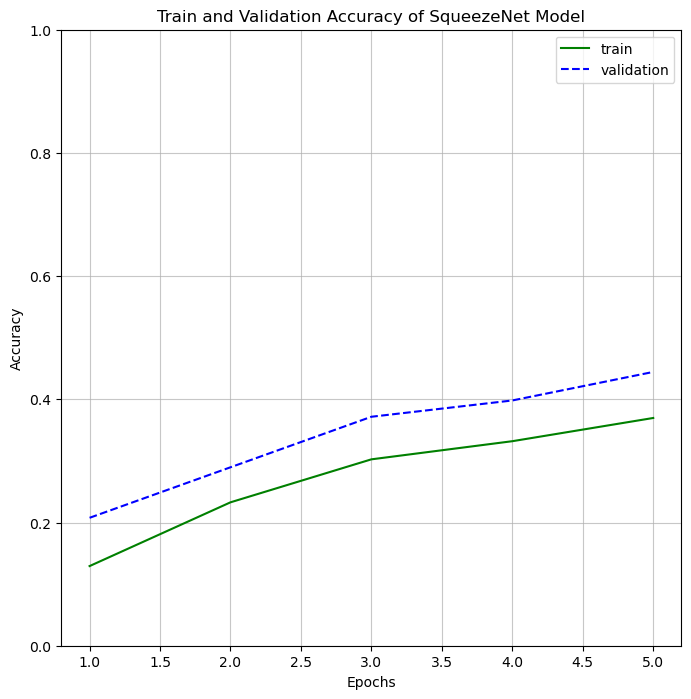

In [599]:
plot_accuracy_pytorch(num_epochs, result_squeezenet, 'SqueezeNet')

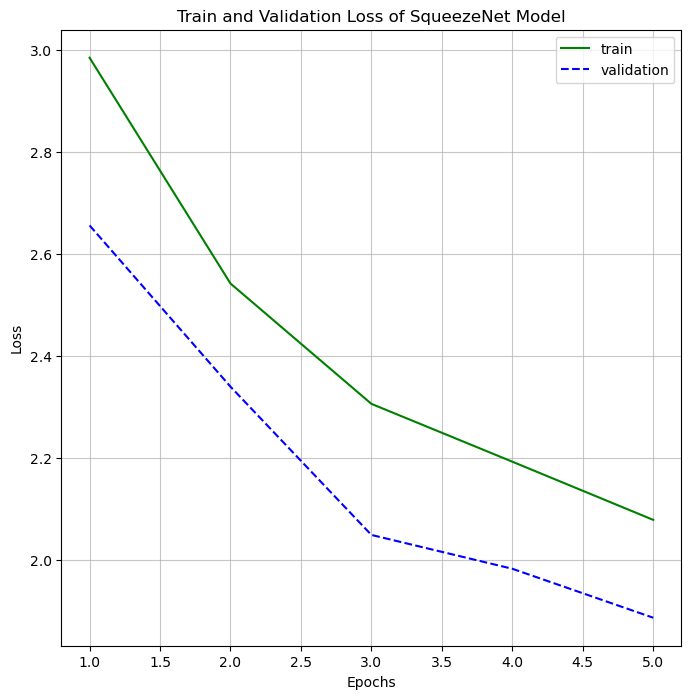

In [600]:
plot_loss_pytorch(num_epochs, result_squeezenet, 'SqueezeNet')

In [ ]:
def predict(model, test_image_name):
    '''
    Function to predict the class of a single test image
    Parameters
        :param model: Model to test
        :param test_image_name: Test image

    '''
    
    transform = squeezenet_transform
    #transform = squeezenet_transform['test']


    test_image = PIL.Image.open(test_image_name)
    plt.imshow(test_image)
    
    test_image_tensor = transform(test_image)

    if torch.cuda.is_available():
        test_image_tensor = test_image_tensor.view(1, 3, 224, 224).cuda()
    else:
        test_image_tensor = test_image_tensor.view(1, 3, 224, 224)
    
    with torch.no_grad():
        model.eval()
        # Model outputs log probabilities
        out = model(test_image_tensor)
        ps = torch.exp(out)
        topk, topclass = ps.topk(8, dim=1)
        for i in range(8):
            print("Predcition", i+1, ":", idx_to_class[topclass.numpy()[0][i]], ", Score: ", topk.numpy()[0][i])

### 2.2.2 DenseNet121

In [620]:
# Number of epochs for training
num_epochs = 5

# Flag for feature extracting. When False, we finetune the whole model, 
#   when True we only update the reshaped layer params
feature_extract = True #@param {type:"boolean"}


# Models to choose from [squeezenet, wideresnet, densenet, shufflenet, googlenet]
model_name = "densenet" #@param ['squeezenet', 'wideresnet', 'densenet', 'shufflenet', 'googlenet']

In [621]:
# Initialize the model for this run
model_ft, input_size = initialize_model(model_name, num_classes, feature_extract)

# Print the model we just instantiated
print(model_ft)

DenseNet(
  (features): Sequential(
    (conv0): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
    (norm0): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu0): ReLU(inplace=True)
    (pool0): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
    (denseblock1): _DenseBlock(
      (denselayer1): _DenseLayer(
        (norm1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu1): ReLU(inplace=True)
        (conv1): Conv2d(64, 128, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (norm2): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu2): ReLU(inplace=True)
        (conv2): Conv2d(128, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      )
      (denselayer2): _DenseLayer(
        (norm1): BatchNorm2d(96, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu

In [622]:
# Send the model to GPU
model_ft = model_ft.to(device)

# Gather the parameters to be optimized/updated in this run. If we are
#  finetuning we will be updating all parameters. However, if we are 
#  doing feature extract method, we will only update the parameters
#  that we have just initialized, i.e. the parameters with requires_grad
#  is True.
params_to_update = model_ft.parameters()
print("Params to learn:")
if feature_extract:
    params_to_update = []
    for name,param in model_ft.named_parameters():
        if param.requires_grad == True:
            params_to_update.append(param)
            print("\t",name)
else:
    for name,param in model_ft.named_parameters():
        if param.requires_grad == True:
            print("\t",name)

# Observe that all parameters are being optimized
#optimizer_ft = optim.SGD(params_to_update, lr=0.001, momentum=0.9) #@param ["optim.SGD(params_to_update, lr=0.001, momentum=0.9)", "optim.Adam(model_ft.parameters(), lr=0.001)"] {type:"raw"}
optimizer_ft = optim.Adam(model_ft.parameters(), lr=0.001)
# Decay LR by a factor of 0.1 every 7 epochs
# ACTIVATION: add "scheduler" arg. to train_model 
exp_lr_scheduler = lr_scheduler.StepLR(optimizer_ft, step_size=7, gamma=0.1)

Params to learn:
	 classifier.weight
	 classifier.bias


In [623]:
# Setup the loss fxn
criterion = nn.CrossEntropyLoss() #@param ["nn.CrossEntropyLoss()", "nn.NLLLoss()"] {type:"raw"}
#criterion = nn.NLLLoss()

In [624]:
# Train and evaluate
model_densenet, result_densenet = train_model(model_ft, dataloaders_dict, 
                                              criterion, optimizer_ft, exp_lr_scheduler, 
                                              num_epochs=num_epochs, is_squeezenet=(model_name=="densenet"))

Epoch: 001/005
Train Loss: 2.9485 Accuracy: 11.2434%
Validate Loss: 2.6638 Accuracy: 26.1905%
Epoch duration: 150.6120s

Epoch: 002/005
Train Loss: 2.6059 Accuracy: 24.4378%
Validate Loss: 2.3797 Accuracy: 28.9683%
Epoch duration: 176.4944s

Epoch: 003/005
Train Loss: 2.3738 Accuracy: 32.1759%
Validate Loss: 2.2074 Accuracy: 37.6984%
Epoch duration: 199.5655s

Epoch: 004/005
Train Loss: 2.2539 Accuracy: 33.9286%
Validate Loss: 2.1360 Accuracy: 35.5820%
Epoch duration: 200.6878s

Epoch: 005/005
Train Loss: 2.1467 Accuracy: 37.0040%
Validate Loss: 2.0379 Accuracy: 41.4021%
Epoch duration: 193.3499s

Training complete in 15m 21s
Best Validation Accuracy: 41.4021%


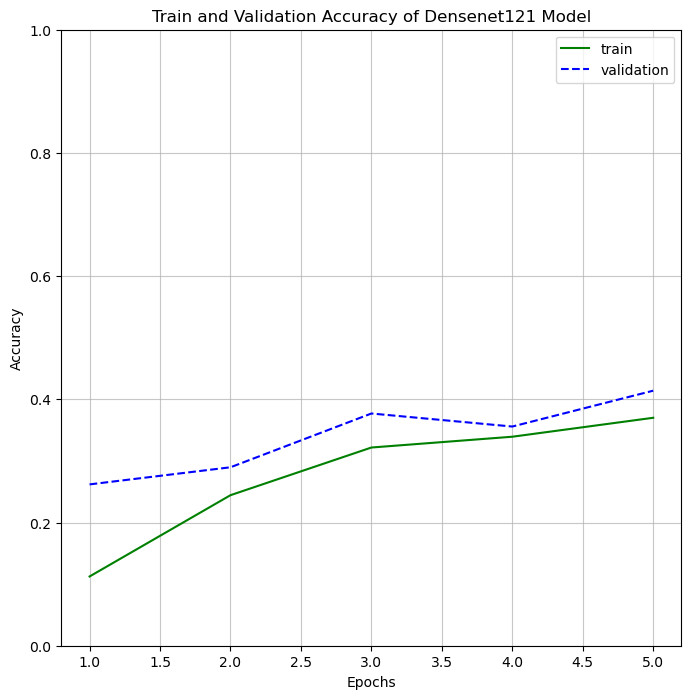

In [626]:
plot_accuracy_pytorch(num_epochs, result_densenet, 'Densenet121')

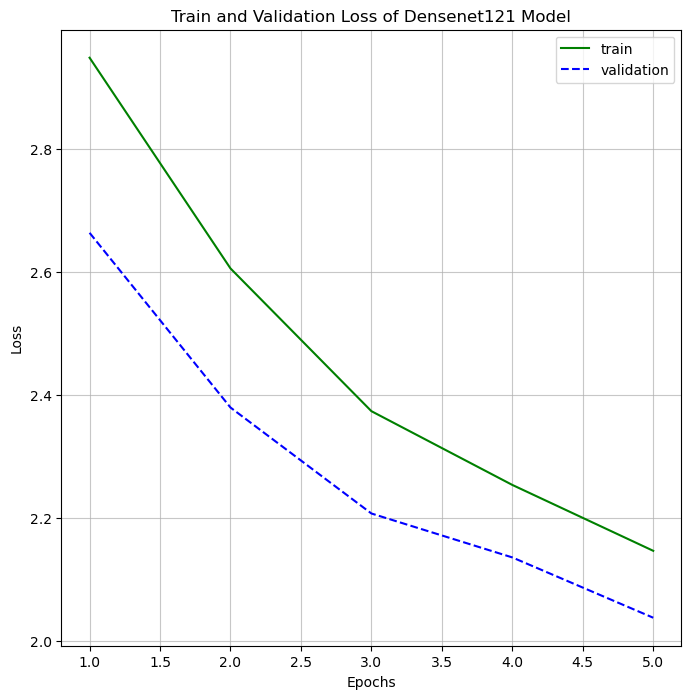

In [627]:
plot_loss_pytorch(num_epochs, result_densenet, 'Densenet121')

### 2.2.3 ShuffleNetV2

In [628]:
# Number of epochs for training
num_epochs = 5

# Flag for feature extracting. When False, we finetune the whole model, 
#   when True we only update the reshaped layer params
feature_extract = True #@param {type:"boolean"}


# Models to choose from [squeezenet, wideresnet, densenet, shufflenet, googlenet]
model_name = "shufflenet" #@param ['squeezenet', 'wideresnet', 'densenet', 'shufflenet', 'googlenet']

In [629]:
# Initialize the model for this run
model_ft, input_size = initialize_model(model_name, num_classes, feature_extract)

# Print the model we just instantiated
print(model_ft)

ShuffleNetV2(
  (conv1): Sequential(
    (0): Conv2d(3, 24, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
    (1): BatchNorm2d(24, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
  )
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (stage2): Sequential(
    (0): InvertedResidual(
      (branch1): Sequential(
        (0): Conv2d(24, 24, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), groups=24, bias=False)
        (1): BatchNorm2d(24, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (2): Conv2d(24, 122, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (3): BatchNorm2d(122, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (4): ReLU(inplace=True)
      )
      (branch2): Sequential(
        (0): Conv2d(24, 122, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (1): BatchNorm2d(122, eps=1e-05, momentum=0.1, affine=True, track_runn

In [630]:
# Send the model to GPU
model_ft = model_ft.to(device)

# Gather the parameters to be optimized/updated in this run. If we are
#  finetuning we will be updating all parameters. However, if we are 
#  doing feature extract method, we will only update the parameters
#  that we have just initialized, i.e. the parameters with requires_grad
#  is True.
params_to_update = model_ft.parameters()
print("Params to learn:")
if feature_extract:
    params_to_update = []
    for name,param in model_ft.named_parameters():
        if param.requires_grad == True:
            params_to_update.append(param)
            print("\t",name)
else:
    for name,param in model_ft.named_parameters():
        if param.requires_grad == True:
            print("\t",name)

# Observe that all parameters are being optimized
#optimizer_ft = optim.SGD(params_to_update, lr=0.001, momentum=0.9) #@param ["optim.SGD(params_to_update, lr=0.001, momentum=0.9)", "optim.Adam(model_ft.parameters(), lr=0.001)"] {type:"raw"}
optimizer_ft = optim.Adam(model_ft.parameters(), lr=0.001)
# Decay LR by a factor of 0.1 every 7 epochs
# ACTIVATION: add "scheduler" arg. to train_model 
exp_lr_scheduler = lr_scheduler.StepLR(optimizer_ft, step_size=7, gamma=0.1)

Params to learn:
	 fc.weight
	 fc.bias


In [631]:
# Setup the loss fxn
criterion = nn.CrossEntropyLoss() #@param ["nn.CrossEntropyLoss()", "nn.NLLLoss()"] {type:"raw"}
#criterion = nn.NLLLoss()

In [632]:
# Train and evaluate
model_shufflenet, result_shufflenet = train_model(model_ft, dataloaders_dict, 
                                                  criterion, optimizer_ft, exp_lr_scheduler, 
                                                  num_epochs=num_epochs, 
                                                  is_squeezenet=(model_name=="shufflenet"))

Epoch: 001/005
Train Loss: 2.8366 Accuracy: 15.3770%
Validate Loss: 2.5017 Accuracy: 35.1852%
Epoch duration: 36.4732s

Epoch: 002/005
Train Loss: 2.4431 Accuracy: 29.0344%
Validate Loss: 2.2493 Accuracy: 37.3016%
Epoch duration: 31.0601s

Epoch: 003/005
Train Loss: 2.2322 Accuracy: 36.4749%
Validate Loss: 2.0758 Accuracy: 45.7672%
Epoch duration: 31.6963s

Epoch: 004/005
Train Loss: 2.1169 Accuracy: 38.3267%
Validate Loss: 1.9351 Accuracy: 47.8836%
Epoch duration: 30.7512s

Epoch: 005/005
Train Loss: 2.0122 Accuracy: 41.6997%
Validate Loss: 1.8830 Accuracy: 46.8254%
Epoch duration: 30.8053s

Training complete in 2m 41s
Best Validation Accuracy: 47.8836%


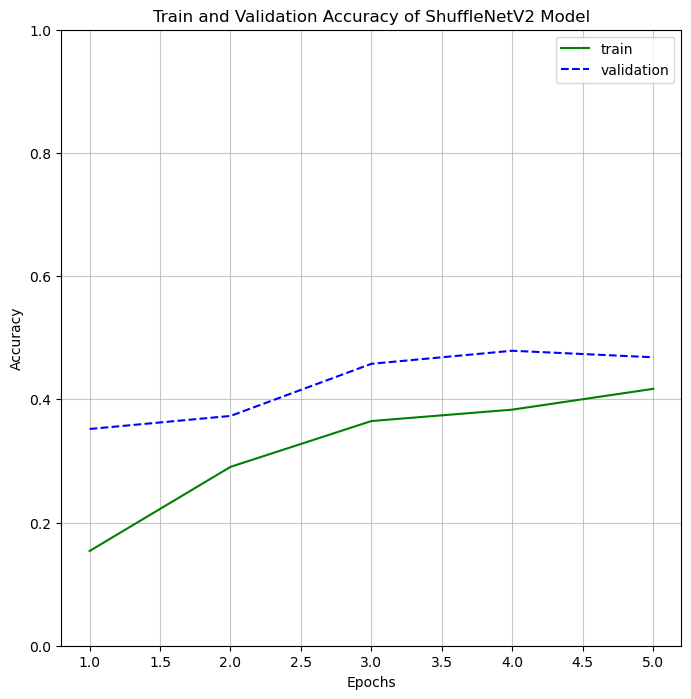

In [633]:
plot_accuracy_pytorch(num_epochs, result_shufflenet, 'ShuffleNetV2')

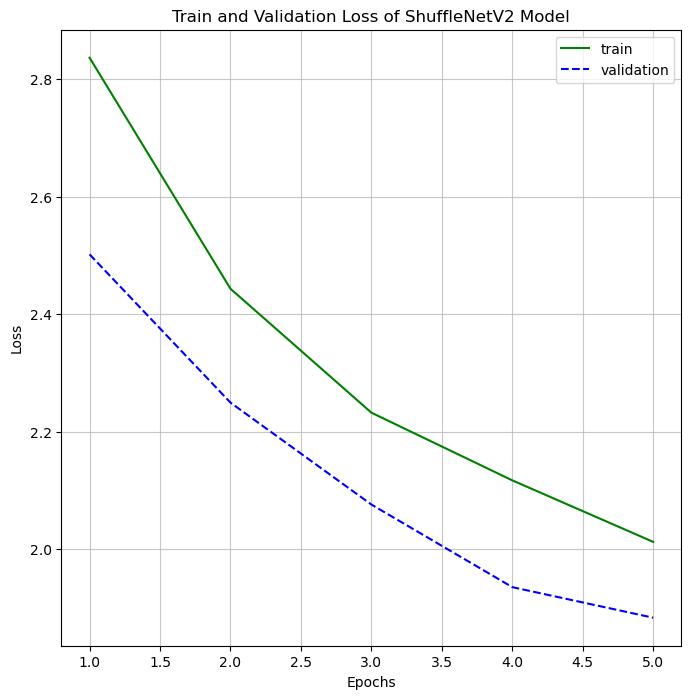

In [634]:
plot_loss_pytorch(num_epochs, result_shufflenet, 'ShuffleNetV2')

### 2.2.4 GoogleNet

In [635]:
# Number of epochs for training
num_epochs = 5

# Flag for feature extracting. When False, we finetune the whole model, 
#   when True we only update the reshaped layer params
feature_extract = True #@param {type:"boolean"}


# Models to choose from [squeezenet, wideresnet, densenet, shufflenet, googlenet]
model_name = "googlenet" #@param ['squeezenet', 'wideresnet', 'densenet', 'shufflenet', 'googlenet']

In [636]:
# Initialize the model for this run
model_ft, input_size = initialize_model(model_name, num_classes, feature_extract)

# Print the model we just instantiated
print(model_ft)

GoogLeNet(
  (conv1): BasicConv2d(
    (conv): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
    (bn): BatchNorm2d(64, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
  )
  (maxpool1): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=True)
  (conv2): BasicConv2d(
    (conv): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn): BatchNorm2d(64, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
  )
  (conv3): BasicConv2d(
    (conv): Conv2d(64, 192, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn): BatchNorm2d(192, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
  )
  (maxpool2): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=True)
  (inception3a): Inception(
    (branch1): BasicConv2d(
      (conv): Conv2d(192, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn): BatchNorm2d(64, eps=0.001, momentum=0.1, affine=True, track

In [637]:
# Send the model to GPU
model_ft = model_ft.to(device)

# Gather the parameters to be optimized/updated in this run. If we are
#  finetuning we will be updating all parameters. However, if we are 
#  doing feature extract method, we will only update the parameters
#  that we have just initialized, i.e. the parameters with requires_grad
#  is True.
params_to_update = model_ft.parameters()
print("Params to learn:")
if feature_extract:
    params_to_update = []
    for name,param in model_ft.named_parameters():
        if param.requires_grad == True:
            params_to_update.append(param)
            print("\t",name)
else:
    for name,param in model_ft.named_parameters():
        if param.requires_grad == True:
            print("\t",name)

# Observe that all parameters are being optimized
#optimizer_ft = optim.SGD(params_to_update, lr=0.001, momentum=0.9) #@param ["optim.SGD(params_to_update, lr=0.001, momentum=0.9)", "optim.Adam(model_ft.parameters(), lr=0.001)"] {type:"raw"}
optimizer_ft = optim.Adam(model_ft.parameters(), lr=0.001)
# Decay LR by a factor of 0.1 every 7 epochs
# ACTIVATION: add "scheduler" arg. to train_model 
exp_lr_scheduler = lr_scheduler.StepLR(optimizer_ft, step_size=7, gamma=0.1)

Params to learn:
	 fc.weight
	 fc.bias


In [638]:
# Setup the loss fxn
criterion = nn.CrossEntropyLoss() #@param ["nn.CrossEntropyLoss()", "nn.NLLLoss()"] {type:"raw"}
#criterion = nn.NLLLoss()

In [639]:
# Train and evaluate
model_googlenet, result_googlenet = train_model(model_ft, dataloaders_dict, 
                                                criterion, optimizer_ft, exp_lr_scheduler, 
                                                num_epochs=num_epochs, is_squeezenet=(model_name=="googlenet"))

Epoch: 001/005
Train Loss: 2.9885 Accuracy: 8.7302%
Validate Loss: 2.7777 Accuracy: 18.1217%
Epoch duration: 76.6345s

Epoch: 002/005
Train Loss: 2.7384 Accuracy: 18.4524%
Validate Loss: 2.6147 Accuracy: 22.2222%
Epoch duration: 78.2120s

Epoch: 003/005
Train Loss: 2.6076 Accuracy: 22.0569%
Validate Loss: 2.4960 Accuracy: 22.8836%
Epoch duration: 75.6233s

Epoch: 004/005
Train Loss: 2.5071 Accuracy: 24.6362%
Validate Loss: 2.4007 Accuracy: 28.8360%
Epoch duration: 75.1166s

Epoch: 005/005
Train Loss: 2.4399 Accuracy: 27.1825%
Validate Loss: 2.3469 Accuracy: 27.9101%
Epoch duration: 77.3476s

Training complete in 6m 23s
Best Validation Accuracy: 28.8360%


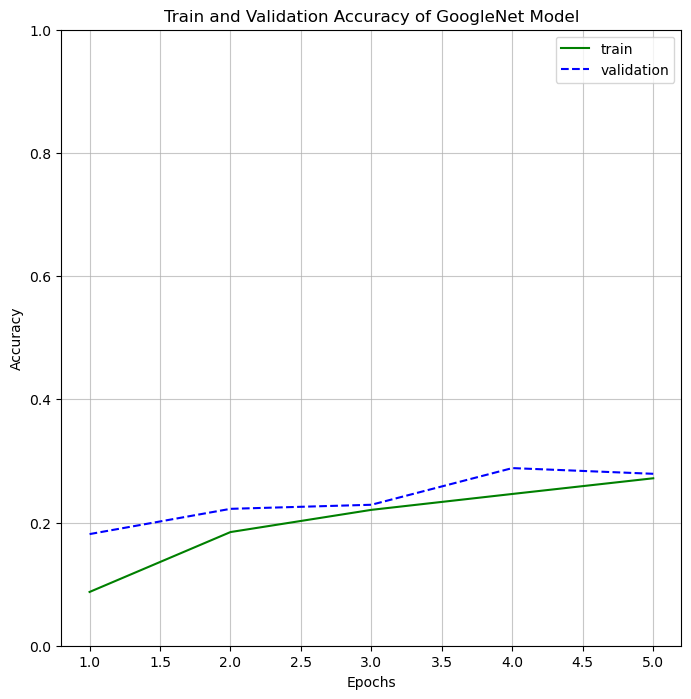

In [640]:
plot_accuracy_pytorch(num_epochs, result_googlenet, 'GoogleNet')

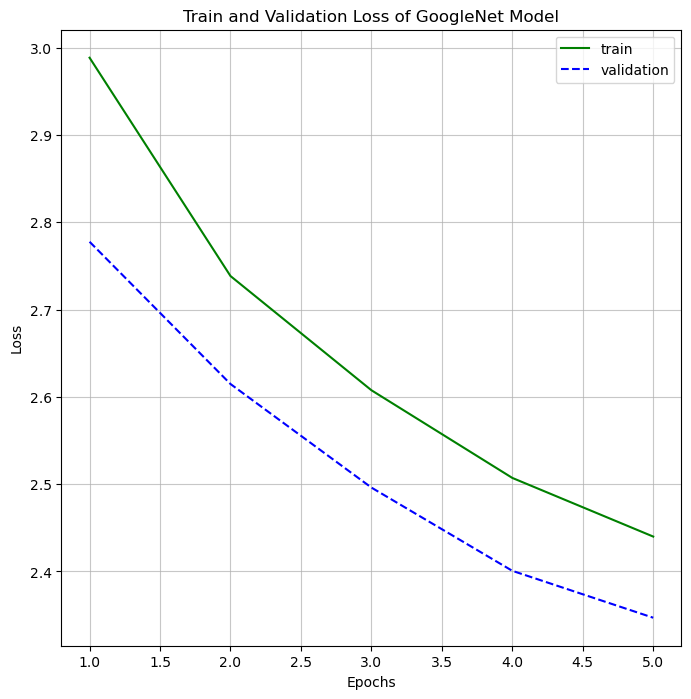

In [641]:
plot_loss_pytorch(num_epochs, result_googlenet, 'GoogleNet')

### 2.2.5 MNASNET1_0

In [645]:
# Number of epochs for training
num_epochs = 5

# Flag for feature extracting. When False, we finetune the whole model, 
#   when True we only update the reshaped layer params
feature_extract = True #@param {type:"boolean"}


# Models to choose from [squeezenet, wideresnet, densenet, shufflenet, googlenet]
model_name = "mnasnet"

In [646]:
# Initialize the model for this run
model_ft, input_size = initialize_model(model_name, num_classes, feature_extract)

# Print the model we just instantiated
print(model_ft)

Invalid model name, exiting...
None


In [603]:
# Send the model to GPU
model_ft = model_ft.to(device)

# Gather the parameters to be optimized/updated in this run. If we are
#  finetuning we will be updating all parameters. However, if we are 
#  doing feature extract method, we will only update the parameters
#  that we have just initialized, i.e. the parameters with requires_grad
#  is True.
params_to_update = model_ft.parameters()
print("Params to learn:")
if feature_extract:
    params_to_update = []
    for name,param in model_ft.named_parameters():
        if param.requires_grad == True:
            params_to_update.append(param)
            print("\t",name)
else:
    for name,param in model_ft.named_parameters():
        if param.requires_grad == True:
            print("\t",name)

# Observe that all parameters are being optimized
#optimizer_ft = optim.SGD(params_to_update, lr=0.001, momentum=0.9) #@param ["optim.SGD(params_to_update, lr=0.001, momentum=0.9)", "optim.Adam(model_ft.parameters(), lr=0.001)"] {type:"raw"}
optimizer_ft = optim.Adam(model_ft.parameters(), lr=0.001)
# Decay LR by a factor of 0.1 every 7 epochs
# ACTIVATION: add "scheduler" arg. to train_model 
exp_lr_scheduler = lr_scheduler.StepLR(optimizer_ft, step_size=7, gamma=0.1)

Params to learn:
	 fc.weight
	 fc.bias


In [604]:
# Setup the loss fxn
criterion = nn.CrossEntropyLoss() #@param ["nn.CrossEntropyLoss()", "nn.NLLLoss()"] {type:"raw"}
#criterion = nn.NLLLoss()

In [612]:
def train_model(model, dataloaders, criterion, optimizer, scheduler, num_epochs=25, is_squeezenet=False):
    since = time.time()

    history = []

    best_model_wts = copy.deepcopy(model.state_dict())
    best_acc = 0.0

    device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
    model = model.to(device)

    for epoch in range(num_epochs):
        epoch_start = time.time()
        print("Epoch: {:03d}/{:03d}".format(epoch + 1, num_epochs))

        for phase in ['train', 'validate']:
            if phase == 'train':
                scheduler.step()
                model.train()
            else:
                model.eval()

            running_loss = 0.0
            running_corrects = 0

            for inputs, labels in dataloaders[phase]:
                inputs = inputs.to(device)
                labels = labels.to(device)

                optimizer.zero_grad()

                with torch.set_grad_enabled(phase == 'train'):
                    loss = torch.tensor(0.0, requires_grad=True).to(device)  # Initialize as a tensor with requires_grad=True

                    if is_squeezenet and phase == 'train':
                        outputs = model(inputs)
                        loss = criterion(outputs, labels)
                    else:
                        outputs = model(inputs)

                        if not is_squeezenet and phase == 'train':
                            # Modify this part based on your model's structure
                            # For example, if your model has auxiliary outputs:
                            # outputs, aux_outputs = model(inputs)
                            # loss1 = criterion(outputs, labels)
                            # loss2 = criterion(aux_outputs, labels)
                            # loss = loss1 + 0.4 * loss2
                            pass
                        else:
                            loss = criterion(outputs, labels)

                    _, preds = torch.max(outputs, 1)

                    if phase == 'train':
                        loss.backward()
                        optimizer.step()

                running_loss += loss.item() * inputs.size(0)
                running_corrects += torch.sum(preds == labels.data)

            epoch_loss = running_loss / len(dataloaders[phase].dataset)
            epoch_acc = running_corrects.double() / len(dataloaders[phase].dataset)

            print("{} Loss: {:.4f} Accuracy: {:.4f}%".format(phase.capitalize(), epoch_loss, epoch_acc * 100))

            # Save information in history
            if phase == 'train':
                train_loss = epoch_loss
                train_accuracy = epoch_acc.item()
            elif phase == 'validate':
                validate_loss = epoch_loss
                validate_accuracy = epoch_acc.item()
                
            if phase == 'validate' and epoch_acc > best_acc:
                best_acc = epoch_acc
                best_model_wts = copy.deepcopy(model.state_dict())
        
        history.append([train_loss, train_accuracy, validate_loss, validate_accuracy])
        
        epoch_end = time.time()
        print("Epoch duration: {:.4f}s".format(epoch_end - epoch_start))
        print()

    time_elapsed = time.time() - since
    print('Training complete in {:.0f}m {:.0f}s'.format(time_elapsed // 60, time_elapsed % 60))
    print('Best Validation Accuracy: {:.4f}%'.format(best_acc * 100))

    # Load best model weights
    model.load_state_dict(best_model_wts)

    return model, history

In [613]:
# Train and evaluate
model_widerestnet, result_widerestnet = train_model(model_ft, dataloaders_dict, 
                                                    criterion, optimizer_ft, exp_lr_scheduler, 
                                                    num_epochs=num_epochs, 
                                                    is_squeezenet=(model_name=="widerestnet"))

Epoch: 001/005
Train Loss: 0.0000 Accuracy: 4.4312%
Validate Loss: 3.0509 Accuracy: 6.0847%
Epoch duration: 519.3730s

Epoch: 002/005
Train Loss: 0.0000 Accuracy: 4.6958%
Validate Loss: 3.0520 Accuracy: 5.2910%
Epoch duration: 465.4033s

Epoch: 003/005


KeyboardInterrupt: 